<h1 align=center><font size =6> Applied Data Science Capstone Project</font></h1>
<h1 align=center><font size=12> A Data Science-Driven Approach to Gastropub Restaurant Location Selection in Toronto</font></h1>

___

## **Introduction**

### The purpose of this project was to use data from the city of Toronto to select suitable neighborhoods for a new gastropub. Instead of relying on qualitative or "gut" decision-making, data on the city of Toronto was used to determine similarities in the characteristics of Toronto neighborhoods that currently host gastropubs. Then similar neighborhoods were recommended as potential locations for a new gastropub.

### **Data**

### The study data included geographic, demographic, and commercial venue data on Toronto neighborhoods. The geographic and demographic data was taken from the Toronto Open Data website, which hosts public data on the city of Toronto. The commercial business data was obtained from the Foursquare API service, which provides search services on commercial (retail, dining, entertainment) venues based on geographic coordinates.

### **Methodology**

### Profiles on each neighborhood were generated from the data. A k-means clustering algorithm was applied to these neighborhood profiles to cluster them by features. The neighborhood clusters were reviewed to identify the one that contained the most existing gastropubs. This was considered the neighborhood cluster with the best features for hosting current and future gastropubs.

___

## **Analysis Procedures**

### 1. Acquire Toronto neighborhood geographic data from the Toronto Open Data website. Use the data to create a dictionary of neighborhood boundaries for use in visually mapping the neighborhoods, and a dataframe with identification and coordinate information for all neighborhoods.

### 2. Acquire Toronto neighborhood demographic profile data from the Toronto Open Data website. Use the data to produce a dataframe with key demographic information on each neighborhood.

### 3. Search for gastropubs in the Toronto area using the Foursquare API.

### 4. Search for general venues around each Toronto neighborhood using the Foursquare API.

### 5. Combine the general venue search result information with the demographic information for each neighborhood.

### 6. Perform exploratory analysis on the neighborhood data to identify general trends and potential feature correlations.

### 7. Perform a k-means clustering algorithm on the neighborhood feature data. Since there isn't a specific cluster size in mind, the algorithm will be performed with a range of cluster sizes.

### 8. After running the algorithm, analyze the quality of the clusters and pick one cluster size to focus on. If one cluster size does not have clearly superior quality, evaluate a few cluster sizes.

### 9. Pick the cluster that best represents the Toronto neighborhoods with existing gastropubs and evaluate  it.

### 10. Evaluate differences within and between clusters.


### Note that at every stage, data wrangling was necessary to retrieve only the necessary information from sources, clean up and organize data, and arrange them into suitable structures for handling, viewing, and analysis.

___

### **Import packages needed for the analysis**

In [1]:
import pandas as pd #pandas to store and maniuplate data in dataframes
import numpy as np #numpy to store and manipulate data in arrays

In [2]:
import folium #folium will be used for generating geographic maps of the area.
import requests #requests will be used to handle API calls to Foursquare.
from pandas.io.json import json_normalize #json_normalize to convert dictionaries from Foursquare into dataframes
import json

In [3]:
#Nominatim will be used to get the the coordinates for the center of Toronto.
# These coordinates will be used for centering the Folium maps.
from geopy.geocoders import Nominatim

In [5]:
#the geodesic function will be used to calculate distances between coordinates.
from geopy.distance import geodesic

In [181]:
#StandardScaler will be used for normalizing data prior to running it in the clustering algorithm.
#KMeans will be used to perform the k-means clustering algorithm
#metrics will be used for scoring the quality of the clusters

from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans 
from sklearn import metrics

In [112]:
# Stats package will be used for calculating statistics on the data.

import scipy
from scipy import stats

In [183]:
# Matplotlib for basic plotting

import matplotlib as mpl
import matplotlib.pyplot as plt

### **Collect and Format Toronto Neighborhood Geographic Information**

### The neighborhood geographic information was in a geoJSON file that contains coordinates for the boundaries of each neighborhood in Toronto. The file also contained coordinates that represent the center of each neighborhood.

### The file was generated from the Toronto Open Data website. There was no direct hyperlink to directly get the data into in the notebook, so the file was downloaded to the local computer and the data was read out of it.

In [624]:
# Read the contents of the file "Neighbourhoods.geojson" into dataframe "tor_nh_coord".


tor_nh_geojson="C:/Users/Gamma user/Desktop/online classes/Coursera/IBM Data Science/Applied Data Science Capstone/Neighbourhoods.geojson"

with open(tor_nh_geojson,"r") as readfile:
    tor_nh_coord=readfile.read()

In [625]:
# The information in "tor_nh_coord" is initially in a string format. "json.loads" converts the string into a dictionary format.

tor_nh_coord_dict=json.loads(tor_nh_coord)

### The dictionary "tor_nh_coord_dict" is the rawest form of the geoJSON file. Although it contained a lot of unnecessary information and its structure was difficult to read, the dictionary was needed because its structure allowed the neighborhood boundary coordinates to be properly read by Folium when generating a map. However, some of the other feature data was useful for data analysis and manipulation, so a portion of the dictionary was exported to a dataframe for easier viewing and manipulation.

In [626]:
# Only one entry in the dictionary "tor_nh_coord_dict" contains the neighborhood data of interest for analytical use. This entry corresponds to the 'features' key.

tor_nh=pd.json_normalize(tor_nh_coord_dict['features'])
tor_nh.head()

,type,properties._id,properties.AREA_ID,properties.AREA_ATTR_ID,properties.PARENT_AREA_ID,properties.AREA_SHORT_CODE,properties.AREA_LONG_CODE,properties.AREA_NAME,properties.AREA_DESC,properties.X,properties.Y,properties.LONGITUDE,properties.LATITUDE,properties.OBJECTID,properties.Shape__Area,properties.Shape__Length,geometry.type,geometry.coordinates
0,Feature,4341,25886861,25926662,49885,94,94,Wychwood (94),Wychwood (94),None,None,-79.425515,43.676919,16491505,3.217960e+06,7515.779658,Polygon,"[[[-79.4359157087306, 43.6801533947749], [-79...."
1,Feature,4342,25886820,25926663,49885,100,100,Yonge-Eglinton (100),Yonge-Eglinton (100),None,None,-79.403590,43.704689,16491521,3.160334e+06,7872.021074,Polygon,"[[[-79.4109578382597, 43.7040828230148], [-79...."
2,Feature,4343,25886834,25926664,49885,97,97,Yonge-St.Clair (97),Yonge-St.Clair (97),None,None,-79.397871,43.687859,16491537,2.222464e+06,8130.411276,Polygon,"[[[-79.391194825918, 43.681081122778], [-79.39..."
3,Feature,4344,25886593,25926665,49885,27,27,York University Heights (27),York University Heights (27),None,None,-79.488883,43.765736,16491553,2.541821e+07,25632.335242,Polygon,"[[[-79.5052879181893, 43.759873498781], [-79.5..."
4,Feature,4345,25886688,25926666,49885,31,31,Yorkdale-Glen Park (31),Yorkdale-Glen Park (31),None,None,-79.457108,43.714672,16491569,1.156669e+07,13953.408098,Polygon,"[[[-79.4396873322608, 43.7056098189112], [-79...."


In [627]:
# Determine how many rows are in dataframe "tor_nh"
print("There are ", len(tor_nh), "rows in the dataframe")

# Determine how many unique values are in 'properties.AREA_SHORT_CODE'
print("There are ", len(tor_nh['properties.AREA_SHORT_CODE'].unique()), "unique entries in column",'properties.AREA_SHORT_CODE')

# Determine how many unique values are in 'properties.AREA_LONG_CODE'
print("There are ",len(tor_nh['properties.AREA_LONG_CODE'].unique()),"unique entries in column",'properties.AREA_LONG_CODE')

# Determine how many unique values are in 'properties.AREA_NAME'
print("There are ",len(tor_nh['properties.AREA_NAME'].unique()),"unique entries in column",'properties.AREA_NAME')

# Determine how many unique values are in 'properties.AREA_DESC'
print("There are ",len(tor_nh['properties.AREA_DESC'].unique()),"unique entries in column",'properties.AREA_DESC')

There are  140 rows in the dataframe
There are  140 unique entries in column properties.AREA_SHORT_CODE
There are  140 unique entries in column properties.AREA_LONG_CODE
There are  140 unique entries in column properties.AREA_NAME
There are  140 unique entries in column properties.AREA_DESC


### Since there are 140 rows and each one has unique entries in the area code and area name descriptions, the data file appeared to have correct information.

### Looking at the first few rows, it appeared that the columns "properties.AREA_SHORT_CODE" and "properties.AREA_LONG_CODE" have identical entries for each row. The columns "properties.AREA_NAME" and "properties.AREA_DESC" also appeared to have identical entries for each row.

### To test this, the contents of each column pair were compared.

In [628]:
# Test to see if 'properties.AREA_NAME' and 'properties.AREA_DESC' have identical values in every row
print(all(tor_nh['properties.AREA_NAME']==tor_nh['properties.AREA_DESC']))

# Test to see if 'properties.AREA_SHORT_CODE' and 'properties.AREA_LONG_CODE' have identical values in every row
print(all(tor_nh['properties.AREA_SHORT_CODE']==tor_nh['properties.AREA_LONG_CODE']))

True
True


### As seen above, "properties.AREA_NAME" and "properties.AREA_DESC" have identical values in every row, as do "properties.AREA_SHORT_CODE" and "properties.AREA_LONG_CODE". Therefore one column in each matching pair was redundant and was dropped.

### **Initial cleanup of dataframe "tor_nh"**

### This cleanup was performed to remove redundant and unnecessary columns, and to rename columns for easier reading and typing.

>### - Since "properties.AREA_NAME" and "properties.AREA_DESC" have identical values in every row, one can be dropped. "properties.AREA_NAME" was retained for use as the primary neighborhood identifier key in future dataframes.
>### - Since "properties.AREA_SHORT_CODE" and "properties.AREA_LONG_CODE" have identical values in every row, one was dropped. "properties.AREA_SHORT_CODE" was retained for use as a key for matching up with the area code column in the neighborhood demographics profile data file.
>### - Since the value for "properties.PARENT_AREA_ID" is the same in every row, the column was dropped.
>### - "type", "properties._id", "properties.AREA_ID", "properties.AREA_ATTR_ID", "properties.X", "properties.Y","properties.OBJECTID" were also dropped.
>### "properties.LONGITUDE" and "properties.LATITUDE" were retained because they contain the central coordinates of each neighborhood. This data was used to generate Folium maps and perform searches in the Foursquare API.

### The columns in "tor_nh" were renamed for clarity.

In [629]:
tor_nh.drop(['type','properties._id','properties.AREA_ID', 'properties.AREA_ATTR_ID','properties.PARENT_AREA_ID', 'properties.AREA_LONG_CODE','properties.AREA_DESC','properties.X', 'properties.Y','properties.OBJECTID','properties.Shape__Area','properties.Shape__Length','geometry.type','geometry.coordinates'],axis=1,inplace=True)
tor_nh.columns=['Area Short Code','Neighborhood','Neighborhood Longitude','Neighborhood Latitude']
tor_nh.head()

,Area Short Code,Neighborhood,Neighborhood Longitude,Neighborhood Latitude
0,94,Wychwood (94),-79.425515,43.676919
1,100,Yonge-Eglinton (100),-79.403590,43.704689
2,97,Yonge-St.Clair (97),-79.397871,43.687859
3,27,York University Heights (27),-79.488883,43.765736
4,31,Yorkdale-Glen Park (31),-79.457108,43.714672


### Now that the neighborhood geographic data was imported into this notebook as a dataframe and cleaned up, it was plotted in a Folium map to make sure the geographic data dictionary and dataframe were properly formatted for Folium to read and that the geographic information was correct.

### First the coordinates for the center of Toronto needed to be acquired in order to center the Folium map on the city. Geocode and Nominatim was used to get the coordinates for Toronto, based on the address name 'Toronto, Ontario'.

In [493]:
geolocator=Nominatim(user_agent='coursera_agent')

address = 'Toronto,Ontario'

geolocator = Nominatim(user_agent="toronto_explorer")
location = geolocator.geocode(address)
tor_latitude = location.latitude
tor_longitude = location.longitude
print(tor_latitude,tor_longitude)

43.6534817 -79.3839347


### Next the Folium map was created. The map contained the neighborhood boundaries in the dictionary "tor_nh_coord_dict" and the central coordinates of each neighborhood, as listed in the dataframe "tor_nh".

In [1048]:
# create initial Folium map of Toronto to ensure the data is correct

map_toronto = folium.Map(location=[tor_latitude, tor_longitude], height=1100, width=2000, zoom_start=11)

for i in range(len(tor_nh_coord_dict['features'])):
    map_toronto.choropleth(
    geo_data=tor_nh_coord_dict['features'][i],
    fill_color='Orange' 
    )
    lat=tor_nh['Neighborhood Latitude'][i]
    lng=tor_nh['Neighborhood Longitude'][i]
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=tor_nh['Neighborhood'][i],
        color='white',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto) 

map_toronto

### All of the neighborhood boundaries appear to be properly rendered on the Folium map. All of the neighborhoods also have their central coordinates shown, so both the boundary and central coordinate information appear to be correct and the dictionary and dataframe are formatted properly.

## **Collect and Format Toronto Neighborhood Demographic Profile Data**

### The next step was to import the neighborhood demographic profile feature data. This data includes information on the demographic profile of each neighborhood, including statistics such as population and distributions of age, income, family structure, living arrangments, ethnicity, language, profession, etc.

### Like the neighborhood geographic data, the neighborhood demographic profile data file was generated from the Toronto Open Data website, and there was no direct hyperlink to directly get the data into in the notebook. This file was also downloaded to the local computer and the data was read into the notebook.

In [663]:
#Import neighborhood demographic data from locally saved file.

tor_nh_profiles_raw=pd.read_csv('neighbourhood-profiles-2016-csv.csv')
tor_nh_profiles_raw

,_id,Category,Topic,Data Source,Characteristic,City of Toronto,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,...,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
0,1,Neighbourhood Information,Neighbourhood Information,City of Toronto,Neighbourhood Number,NaN,129,128,20,95,...,37,7,137,64,60,94,100,97,27,31
1,2,Neighbourhood Information,Neighbourhood Information,City of Toronto,TSNS2020 Designation,NaN,No Designation,No Designation,No Designation,No Designation,...,No Designation,No Designation,NIA,No Designation,No Designation,No Designation,No Designation,No Designation,NIA,Emerging Neighbourhood
2,3,Population,Population and dwellings,Census Profile 98-316-X2016001,"Population, 2016","2,731,571","29,113","23,757","12,054","30,526",...,"16,936","22,156","53,485","12,541","7,865","14,349","11,817","12,528","27,593","14,804"
3,4,Population,Population and dwellings,Census Profile 98-316-X2016001,"Population, 2011","2,615,060","30,279","21,988","11,904","29,177",...,"15,004","21,343","53,350","11,703","7,826","13,986","10,578","11,652","27,713","14,687"
4,5,Population,Population and dwellings,Census Profile 98-316-X2016001,Population Change 2011-2016,4.50%,-3.90%,8.00%,1.30%,4.60%,...,12.90%,3.80%,0.30%,7.20%,0.50%,2.60%,11.70%,7.50%,-0.40%,0.80%
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2378,2379,Mobility,Mobility status - Place of residence 5 years ago,Census Profile 98-316-X2016001,Migrants,"400,950","3,170","3,145",925,"6,390",...,"3,765","2,270","7,260",985,620,"1,350","2,425","2,310","4,965","1,345"
2379,2380,Mobility,Mobility status - Place of residence 5 years ago,Census Profile 98-316-X2016001,Internal migrants,"184,120",880,980,680,"3,930",...,"1,545","1,110","1,720",610,395,780,"1,260","1,355","1,700",580
2380,2381,Mobility,Mobility status - Place of residence 5 years ago,Census Profile 98-316-X2016001,Intraprovincial migrants,"141,135",735,760,615,"2,630",...,"1,070",960,"1,400",350,320,570,970,"1,025","1,490",445
2381,2382,Mobility,Mobility status - Place of residence 5 years ago,Census Profile 98-316-X2016001,Interprovincial migrants,"42,985",135,220,70,"1,310",...,475,150,335,250,85,210,290,325,195,135


### The next step was to extract the feature data of interest for this analysis. While it would have been interesting to include all of the features for analysis, the sheer number of features in this data (nearly 2400) would have made this difficult to manage, so the focus was on some higher level features, including age, family characteristics, and income.

### These higher level features, along with the neighborhood name and number, were extracted to a new dataframe "tor_nh_profiles".

In [717]:
tor_nh_profile_rows=[0,2,4,7,
                     9,10,11,12,13,14,
                     75,76,79,
                     67, 68, 69, 70, 71, 72,
                     74,
                     90,91,94,89,98,
                     1029,8]
tor_nh_profile_rows
tor_nh_profiles=tor_nh_profiles_raw.iloc[tor_nh_profile_rows,:]
tor_nh_profiles.set_index('Characteristic',inplace=True)
tor_nh_profiles.drop(['_id','Category','Topic','Data Source','City of Toronto'],axis=1,inplace=True)
tor_nh_profiles=tor_nh_profiles.transpose()
tor_nh_profiles.reset_index(inplace=True)

# For the column names, the column number was included to make it easier to reference the column by numeric position.

tor_nh_profiles.columns=['0, Neighborhood','1, NH Number','2, Pop','3, Pop Change','4, Pop Density',
                         '5, Children','6, Youth','7, Working Age','8, Pre-Retire','9, Seniors', '10, Older Seniors',
                         '11, Marriage Age Population','12, Married','13, Not Married',
                         '14, Households','15, 1 Person Household','16, 2 Person Household','17, 3 Person Household','18, 4 Person Household','19, 5+ Person Household',
                         '20, Avg Household Size',
                         '21, Families','22, Couple Families','23, Single Families','24, Couples without Children','25, Couples with Children',
                         '26, Average Income','27, Land Area']
tor_nh_profiles

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,"0, Neighborhood","1, NH Number","2, Pop","3, Pop Change","4, Pop Density","5, Children","6, Youth","7, Working Age","8, Pre-Retire","9, Seniors",...,"18, 4 Person Household","19, 5+ Person Household","20, Avg Household Size","21, Families","22, Couple Families","23, Single Families","24, Couples without Children","25, Couples with Children","26, Average Income","27, Land Area"
0,Agincourt North,129,"29,113",-3.90%,"3,929","3,840","3,705","11,305","4,230","6,045",...,1750,1645,3.16,8425,6770,1655,2520,4250,"427,037",7.41
1,Agincourt South-Malvern West,128,"23,757",8.00%,"3,034","3,075","3,360","9,965","3,265","4,105",...,1335,1175,2.88,6640,5275,1365,2095,3180,"278,390",7.83
2,Alderwood,20,"12,054",1.30%,"2,435","1,760","1,235","5,220","1,825","2,015",...,795,390,2.6,3490,2815,665,1175,1645,"168,602",4.95
3,Annex,95,"30,526",4.60%,"10,863","2,360","3,750","15,040","3,480","5,910",...,885,390,1.8,6700,5805,895,3830,1975,"792,507",2.81
4,Banbury-Don Mills,42,"27,695",2.90%,"2,775","3,605","2,730","10,810","3,555","6,975",...,1515,675,2.23,7605,6350,1245,3015,3335,"493,486",9.98
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,Wychwood,94,"14,349",2.60%,"8,541","1,860","1,320","6,420","1,595","3,150",...,750,330,2.24,3475,2730,750,1320,1405,"239,484",1.68
136,Yonge-Eglinton,100,"11,817",11.70%,"7,162","1,800","1,225","5,860","1,325","1,600",...,690,220,2.08,3065,2640,425,1290,1350,"222,648",1.65
137,Yonge-St.Clair,97,"12,528",7.50%,"10,708","1,210",920,"5,960","1,540","2,905",...,395,135,1.76,3160,2775,390,1850,925,"541,217",1.17
138,York University Heights,27,"27,593",-0.40%,"2,086","4,045","4,750","12,290","2,965","3,530",...,1495,1325,2.71,7000,4920,2075,1955,2960,"302,358",13.23


### The next step was initial cleanup of the data in the new dataframe "tor_nh_profiles".

In [718]:
tor_nh_profiles.dtypes

0, Neighborhood                 object
1, NH Number                    object
2, Pop                          object
3, Pop Change                   object
4, Pop Density                  object
5, Children                     object
6, Youth                        object
7, Working Age                  object
8, Pre-Retire                   object
9, Seniors                      object
10, Older Seniors               object
11, Marriage Age Population     object
12, Married                     object
13, Not Married                 object
14, Households                  object
15, 1 Person Household          object
16, 2 Person Household          object
17, 3 Person Household          object
18, 4 Person Household          object
19, 5+ Person Household         object
20, Avg Household Size          object
21, Families                    object
22, Couple Families             object
23, Single Families             object
24, Couples without Children    object
25, Couples with Children

### A quick check of the data in "tor_nh_profiles" showed they were all type "object". Most would need to be converted to floating point values for calculations and analysis. Before conversion, the data needed to be formatted to remove the percent signs and commas in order to be properly read and converted.

### Most of the demographic data that was sliced out of the raw profiles dataset was in the form of absolute populations falling into each category. For more relevant comparison between neighborhoods, each population group was normalized to the total population of its relevant group type in each neighborhood.

In [719]:
#Clean up and normalize the neighborhood demographic data

# Copy "tor_nh_profiles" into a new dataframe "tor_nh_profiles_stats" for further editing
# "tor_nh_profiles" will remain as a master data file to minimize the need for redownloading to fix edits

tor_nh_profiles_stats=tor_nh_profiles[:]

#Clean up formatting of the numeric data by removing commas and percentage signs and converting them into floating point values.


for i in range(2,tor_nh_profiles.shape[1]):
    tor_nh_profiles_stats.iloc[:,i]=tor_nh_profiles_stats.iloc[:,i].apply(lambda x: x.replace(',',''))
    tor_nh_profiles_stats.iloc[:,i]=tor_nh_profiles_stats.iloc[:,i].apply(lambda x: x.replace('%',''))
    tor_nh_profiles_stats.iloc[:,i]=tor_nh_profiles_stats.iloc[:,i].astype(float)

# Normalize the population of each age group, relative the total population

tor_nh_profiles_stats.iloc[:,5]=tor_nh_profiles_stats.iloc[:,5]/tor_nh_profiles_stats.iloc[:,2]
tor_nh_profiles_stats.iloc[:,6]=tor_nh_profiles_stats.iloc[:,6]/tor_nh_profiles_stats.iloc[:,2]
tor_nh_profiles_stats.iloc[:,7]=tor_nh_profiles_stats.iloc[:,7]/tor_nh_profiles_stats.iloc[:,2]
tor_nh_profiles_stats.iloc[:,8]=tor_nh_profiles_stats.iloc[:,8]/tor_nh_profiles_stats.iloc[:,2]
tor_nh_profiles_stats.iloc[:,9]=tor_nh_profiles_stats.iloc[:,9]/tor_nh_profiles_stats.iloc[:,2]
tor_nh_profiles_stats.iloc[:,10]=tor_nh_profiles_stats.iloc[:,10]/tor_nh_profiles_stats.iloc[:,2]


# Normalize the married household populations with and without children populations, relative to the total married household population

tor_nh_profiles_stats.iloc[:,24]=tor_nh_profiles_stats.iloc[:,24]/tor_nh_profiles_stats.iloc[:,22]
tor_nh_profiles_stats.iloc[:,25]=tor_nh_profiles_stats.iloc[:,25]/tor_nh_profiles_stats.iloc[:,22]

# Normalize the married and unmarried populations, relative to the total marriage age population

tor_nh_profiles_stats.iloc[:,12]=tor_nh_profiles_stats.iloc[:,12]/tor_nh_profiles_stats.iloc[:,11]
tor_nh_profiles_stats.iloc[:,13]=tor_nh_profiles_stats.iloc[:,13]/tor_nh_profiles_stats.iloc[:,11]

# Normalize the households by occupant count, relative to the total number of households

tor_nh_profiles_stats.iloc[:,15]=tor_nh_profiles_stats.iloc[:,15]/tor_nh_profiles_stats.iloc[:,14]
tor_nh_profiles_stats.iloc[:,16]=tor_nh_profiles_stats.iloc[:,16]/tor_nh_profiles_stats.iloc[:,14]
tor_nh_profiles_stats.iloc[:,17]=tor_nh_profiles_stats.iloc[:,17]/tor_nh_profiles_stats.iloc[:,14]
tor_nh_profiles_stats.iloc[:,18]=tor_nh_profiles_stats.iloc[:,18]/tor_nh_profiles_stats.iloc[:,14]
tor_nh_profiles_stats.iloc[:,19]=tor_nh_profiles_stats.iloc[:,19]/tor_nh_profiles_stats.iloc[:,14]


# Normalize the family type populations, relative to the total number of families

tor_nh_profiles_stats.iloc[:,22]=tor_nh_profiles_stats.iloc[:,22]/tor_nh_profiles_stats.iloc[:,21]
tor_nh_profiles_stats.iloc[:,23]=tor_nh_profiles_stats.iloc[:,23]/tor_nh_profiles_stats.iloc[:,21]


# A new column will be added to represent housing density (number of households divided by neighborhood land area)

tor_nh_profiles_stats['Housing Density']=tor_nh_profiles_stats.iloc[:,14]/tor_nh_profiles_stats.iloc[:,27]


tor_nh_profiles_stats.head()

,"0, Neighborhood","1, NH Number","2, Pop","3, Pop Change","4, Pop Density","5, Children","6, Youth","7, Working Age","8, Pre-Retire","9, Seniors",...,"19, 5+ Person Household","20, Avg Household Size","21, Families","22, Couple Families","23, Single Families","24, Couples without Children","25, Couples with Children","26, Average Income","27, Land Area",Housing Density
0,Agincourt North,129,29113.0,-3.9,3929.0,0.131900,0.127263,0.388314,0.145296,0.207639,...,0.180274,3.16,8425.0,0.803561,0.196439,0.372230,0.627770,427037.0,7.41,1231.443995
1,Agincourt South-Malvern West,128,23757.0,8.0,3034.0,0.129436,0.141432,0.419455,0.137433,0.172791,...,0.144349,2.88,6640.0,0.794428,0.205572,0.397156,0.602844,278390.0,7.83,1039.591315
2,Alderwood,20,12054.0,1.3,2435.0,0.146010,0.102456,0.433051,0.151402,0.167164,...,0.084416,2.60,3490.0,0.806590,0.190544,0.417407,0.584369,168602.0,4.95,933.333333
3,Annex,95,30526.0,4.6,10863.0,0.077311,0.122846,0.492695,0.114001,0.193605,...,0.024490,1.80,6700.0,0.866418,0.133582,0.659776,0.340224,792507.0,2.81,5667.259786
4,Banbury-Don Mills,42,27695.0,2.9,2775.0,0.130168,0.098574,0.390323,0.128363,0.251851,...,0.055670,2.23,7605.0,0.834977,0.163708,0.474803,0.525197,493486.0,9.98,1214.929860


## **Acquire Venue Data from Foursquare**
___

### Now that the neighborhood central coordinates were obtained, they were used as starting points to search for venues in Toronto.

### **Foursquare API**

### Each Foursquare API request required several inputs.
>### - Three are required for every request, and their values remained constant - client ID, client secret, and version.
>### - The other required inputs varied depending on search type.
>### - For searches based on location, the starting search coordinates, search radius, and search results limit were needed. Additionally, the type of search needed to be specified, with types including search by keyword (search query), search by venue category (category ID), or search by popularity (explore).


### For the initial search on gastropubs, the search by category ID method was used. Trial API request runs showed that searching by category ID yielded more relevant gastropub search results than the keyword or popularity search.


### When searching for venues around each neighborhood, the explore search method was used to find the most popular or common venues around each neighborhood, regardless of specific descriptions, names, or categories.

### The search limit was set at 100. Trial API request runs indicated the search limit varied depending on the type of search, but 100 appeared to be the general maximum for free Foursquare API service accounts. Explore searches tended to allow up to 100 while searches by keyword query or category ID usually only allowed up to 50 results.

### Determining suitable search radii was more complicated and is detailed below.
___

### **Gastropub Search Radius Determination**

### - The simplest method would have been to assign an arbitrarily large search radius for gastropubs, starting at the Toronto central coordinates provided by Nominatim. This would necessarily produce a large list, but only the ones close to a Toronto neighborhood would need to be retained, and the rest discarded. This method was not used because of limitations discovered in the Foursquare API requests-the search limit of 100 filled very quickly, even at smaller search radii, and tended to be filled with results that did not match the search parameters. Therefore, many of the target venues would have been left out of the search results.

### - The method that was used involved searching a smaller search radius around the central coordinates of every Toronto neighborhood. This distributed search approach allowed more of the gastropub venues to be found while reducing the number of times that the search limit was reached and potentially caused some data to be left out. The search radius to use for gastropub searches was based on the neighborhood geographic data. Too large of a search radius would have included too many irrelevant venues, potentially leaving out the target search venues. Too small of a search radius would have left large areas unexplored. Therefore, the distances between neighborhood central coordinates were calculated to determine search radius values that would not be too extreme.

### The geodesic function was used to calculate the linear distance between the central coordinates of every pair of Toronto neighborhoods. These were first output to an array, then converted to a dataframe. Neighborhood names were added to the dataframe added to identify corresponding neighborhood pairs for each distance.

In [495]:
#calculate distance between the central coordinates for each neighborhood
tor_nh_dist_matrix=np.zeros(shape=(tor_nh.shape[0],tor_nh.shape[0]))

for a in range(len(tor_nh)):
    lat1=tor_nh['Neighborhood Latitude'][a]
    lon1=tor_nh['Neighborhood Longitude'][a]
    for b in range(len(tor_nh)):
        lat2=tor_nh['Neighborhood Latitude'][b]
        lon2=tor_nh['Neighborhood Longitude'][b]
        tor_nh_dist_matrix[a,b]=geodesic((lat1,lon1),(lat2,lon2)).m

tor_nh_dist_matrix

array([[    0.        ,  3555.88587999,  2538.87749674, ...,
        10164.67587407,  7336.77824986, 15962.54551427],
       [ 3555.88587999,     0.        ,  1925.97632073, ...,
        11646.60054844, 10331.89774448, 12420.02166103],
       [ 2538.87749674,  1925.97632073,     0.        , ...,
        12155.21065875,  9857.79014637, 13753.61334215],
       ...,
       [10164.67587407, 11646.60054844, 12155.21065875, ...,
            0.        ,  5879.28146788, 21680.77955119],
       [ 7336.77824986, 10331.89774448,  9857.79014637, ...,
         5879.28146788,     0.        , 22366.87456523],
       [15962.54551427, 12420.02166103, 13753.61334215, ...,
        21680.77955119, 22366.87456523,     0.        ]])

In [496]:
#Convert numpy array of distances between neighborhood coordinates into a dataframe and format the index and column names

tor_nh_dist=pd.DataFrame(tor_nh_dist_matrix)
tor_nh_dist.index=tor_nh['Neighborhood']
tor_nh_dist.columns=tor_nh['Neighborhood']
tor_nh_dist.reset_index(inplace=True)
tor_nh_dist.index.name="Index"
tor_nh_dist

Neighborhood,Neighborhood,Wychwood (94),Yonge-Eglinton (100),Yonge-St.Clair (97),York University Heights (27),Yorkdale-Glen Park (31),Lambton Baby Point (114),Lansing-Westgate (38),Lawrence Park North (105),Lawrence Park South (103),...,Humewood-Cedarvale (106),Ionview (125),Islington-City Centre West (14),Junction Area (90),Keelesdale-Eglinton West (110),Kennedy Park (124),Kensington-Chinatown (78),Kingsview Village-The Westway (6),Kingsway South (15),L'Amoreaux (117)
Index,,,,,,,,,,,,,,,,,,,,,
0,Wychwood (94),0.000000,3555.885880,2538.877497,11111.026905,4907.190962,6087.080200,8594.534570,6154.204928,4744.058855,...,1615.035034,13940.324189,10659.161587,3837.140028,3830.039452,14366.020351,3455.447100,10164.675874,7336.778250,15962.545514
1,Yonge-Eglinton (100),3555.885880,0.000000,1925.976321,9655.126916,4453.649304,9119.243789,5766.596618,2819.040596,1405.247488,...,2441.760279,11102.019726,13770.118831,6829.652300,5861.249367,11771.539399,5704.460290,11646.600548,10331.897744,12420.021661
2,Yonge-St.Clair (97),2538.877497,1925.976321,0.000000,11342.178345,5628.068087,8609.418493,7690.128836,4714.610086,3327.092853,...,2435.032664,11401.746704,13197.115904,6333.834927,5936.152214,11846.706822,3811.795718,12155.210659,9857.790146,13753.613342
3,York University Heights (27),11111.026905,9655.126916,11342.178345,0.000000,6224.340119,12048.499397,5319.513758,7904.397376,8579.120625,...,9622.125768,17753.830250,15337.448515,10961.928510,9000.006925,18938.979838,14488.288182,8807.525361,12589.942292,14460.340527
4,Yorkdale-Glen Park (31),4907.190962,4453.649304,5628.068087,6224.340119,0.000000,7093.521770,5114.188087,4609.948352,4125.180402,...,3511.144239,15053.902375,11390.441740,5324.621725,3417.009557,15898.672450,8331.444271,7519.449433,8046.644888,14620.481486
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,Kennedy Park (124),14366.020351,11771.539399,11846.706822,18938.979838,15898.672450,20451.952807,13619.553168,11580.641792,11773.695437,...,14008.864852,1461.588353,25004.240677,18180.495180,17577.511975,0.000000,13628.798100,23356.108486,21701.288708,8914.524934
136,Kensington-Chinatown (78),3455.447100,5704.460290,3811.795718,14488.288182,8331.444271,7982.079888,11407.858830,8517.639713,7108.241870,...,4866.283615,13557.086502,11995.690343,6193.417686,6970.388227,13628.798100,0.000000,13153.809897,9143.053625,17157.563572
137,Kingsview Village-The Westway (6),10164.675874,11646.600548,12155.210659,8807.525361,7519.449433,6228.542003,11667.289333,12098.519289,11608.627110,...,9725.336072,22557.782406,7289.901578,7064.966995,6335.259821,23356.108486,13153.809897,0.000000,5879.281468,21680.779551


### The values in each row were then sorted from smallest to largest. The first sorted column contained the smallest value in every row. This column contained 0 in every row since it corresponded to the distance between each neighborhood and itself. This value was not useful, so the second column was considered.

### The second column contained the next lowest values, corresponding to the distance between each neighborhood and its nearest adjacent neighborhood.

### Basic statistics were performed on the values in this column to get the minimum, maximum, and mean values.

In [497]:
#Calculate the minimum, maximum, and mean distance between adjacent neighborhoods from the values in the array "tor_nh_dist_matrix"
#np.sort(tor_nh_dist_matrix,axis=1) sorts the values from smallest to largest in each row
#The lowest value in each row will be zero, which is the distance from each neighbhorhood's representative coordinates to itself, so it is not a relevant value to consider
#The second lowest value in each row should be the distance from the row's respective neighborhood coordinates to the nearest adjacent neighborhood
#The purpose of calculating these distances was to determine a suitable, consistent search radius to apply for the Foursquare search/explore API calls without repeatedly making calls with different arbritrary search radii
#The search radius should be not be too small of a search radius would return too few results and leave many venues in between neighborhood coordinates untouched, while a search radius that is too large will return too many results or only the most popular results

tor_nh_dist_matrix_sorted=np.sort(tor_nh_dist_matrix, axis=1)

tor_nh_dist_min=tor_nh_dist_matrix_sorted[:,1].min()
tor_nh_dist_max=tor_nh_dist_matrix_sorted[:,1].max()
tor_nh_dist_mean=tor_nh_dist_matrix_sorted[:,1].mean()
print('minimum distance between adjacent neighborhoods: ', tor_nh_dist_min, 'meters')
print('maximum distance between adjacent neighborhoods: ', tor_nh_dist_max, 'meters')
print('average distance between adjacent neighborhoods: ', tor_nh_dist_mean, 'meters')

minimum distance between adjacent neighborhoods:  590.6332913961647 meters
maximum distance between adjacent neighborhoods:  3455.1799099388645 meters
average distance between adjacent neighborhoods:  1543.8667735550832 meters


### The distances between neighborhoods ranged from 590 to 3455m, with an average of 1544m. The maximum distance of 3455m wasn't a very large value, so it was used as the search radius.
___

### **Search for Gastropubs**

### Now that a search radius value was defined for the gastropubs, all of the information needed for a Foursquare API search request had been gathered and calls could be made.

### Each API search request can only be made for a single starting search location, so a for loop was created to perform an API call for a search from every neighborhood's central coordinates. At the end of each loop, the search results were appended into a single dataframe.

### A search by category ID was performed because this returned the most relevant venues.

In [26]:
# @hidden cell
CLIENT_ID = 'ECC2HWF5OWZZEIKVGPZJUMUCBS2CCFH5EWUL2L322MTSNIOH' # your Foursquare ID
CLIENT_SECRET = 'GD0VADPF0SPBZ4OWACL4B5KHEPLGXV1ZZ4R4JDEJQVVVJCLM' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

In [498]:
# Search for gastropub venues in all neighborhoods

gastropub_search_results_raw_=pd.DataFrame()

for x in range(len(tor_nh)):
    lat=tor_nh['Neighborhood Latitude'][x]
    lng=tor_nh['Neighborhood Longitude'][x]
    category_id='4bf58dd8d48988d155941735' #Foursquare search category id for "gastropub"
    radius=tor_nh_dist_max #use the maximum calculated distance between representative coordinates for adjacent neighborhoods as the search radius
    LIMIT=100
    url = 'https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng,
            category_id,
            radius, 
            LIMIT)
    
    results = requests.get(url).json()["response"]
    search_results=pd.json_normalize(results['venues'])
    gastropub_search_results_raw_=gastropub_search_results_raw_.append(search_results)

### The search results were saved to a new dataframe for further analysis and manipulation and to prevent accidental edits to the original dataframe of data returned from the API. Undoing any edits to the original dataframe would have required followup API calls to update information the dataframe.

In [499]:
# save the search results to a new dataframe for further analysis and manipulation to reduce the number of API calls needed to update requested information in case of errors
gastropub_search_results_raw=gastropub_search_results_raw_[:]
gastropub_search_results_raw

,id,name,categories,referralId,hasPerk,location.address,location.crossStreet,location.lat,location.lng,location.labeledLatLngs,location.distance,location.postalCode,location.cc,location.city,location.state,location.country,location.formattedAddress,venuePage.id,location.neighborhood
0,4cbf015897bc721e6fe08267,Chadwick's,"[{'id': '4bf58dd8d48988d155941735', 'name': 'G...",v-1588277898,False,268 Howland Ave,at Dupont St,43.673593,-79.412015,"[{'label': 'display', 'lat': 43.67359329474282...",1148,M5R 3B6,CA,Toronto,ON,Canada,"[268 Howland Ave (at Dupont St), Toronto ON M5...",48737735,NaN
1,4f9b0e84e4b0d04dbf9767ee,The Oxley Public House,"[{'id': '4bf58dd8d48988d155941735', 'name': 'G...",v-1588277898,False,121 Yorkville Ave,Hazelton Ave,43.670537,-79.392977,"[{'label': 'display', 'lat': 43.67053669383452...",2714,M5R 1C4,CA,Toronto,ON,Canada,"[121 Yorkville Ave (Hazelton Ave), Toronto ON ...",NaN,NaN
2,506f3aa3e4b0b0ed3e1dc405,Indie Alehouse,"[{'id': '4bf58dd8d48988d155941735', 'name': 'G...",v-1588277898,False,2876 Dundas St W,at Keele St,43.665475,-79.465290,"[{'label': 'display', 'lat': 43.66547472315272...",3446,M6P 1Y9,CA,Toronto,ON,Canada,"[2876 Dundas St W (at Keele St), Toronto ON M6...",NaN,The Junction
3,4e235b5cd22d0a3f5a0bc0a2,Folly Brewpub,"[{'id': '4bf58dd8d48988d155941735', 'name': 'G...",v-1588277898,False,928 College St,at Dovercourt Ave,43.653806,-79.425850,"[{'label': 'display', 'lat': 43.65380564851785...",2573,M6H 1A4,CA,Toronto,ON,Canada,"[928 College St (at Dovercourt Ave), Toronto O...",33743957,NaN
4,4ad4c05df964a5204df620e3,Rebel House,"[{'id': '4bf58dd8d48988d116941735', 'name': 'B...",v-1588277898,False,1068 Yonge St.,btwn Roxborough St. & Gibson Ave.,43.677661,-79.389935,"[{'label': 'display', 'lat': 43.67766092876885...",2865,M4W 2L4,CA,Toronto,ON,Canada,[1068 Yonge St. (btwn Roxborough St. & Gibson ...,105480685,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,4e569dfd1495eb38e20ac5c5,Monk's Kettle,"[{'id': '4bf58dd8d48988d155941735', 'name': 'G...",v-1588277935,False,3073 Bloor St. W.,at Brentwood Rd. S.,43.646806,-79.513775,"[{'label': 'display', 'lat': 43.64680589371333...",790,M8X 1C7,CA,Toronto,ON,Canada,"[3073 Bloor St. W. (at Brentwood Rd. S.), Toro...",NaN,NaN
1,506f3aa3e4b0b0ed3e1dc405,Indie Alehouse,"[{'id': '4bf58dd8d48988d155941735', 'name': 'G...",v-1588277935,False,2876 Dundas St W,at Keele St,43.665475,-79.465290,"[{'label': 'display', 'lat': 43.66547472315272...",3882,M6P 1Y9,CA,Toronto,ON,Canada,"[2876 Dundas St W (at Keele St), Toronto ON M6...",NaN,The Junction
2,4ed549aa99119575ff17fbc4,Henry VIII Ale House,"[{'id': '4bf58dd8d48988d155941735', 'name': 'G...",v-1588277935,False,2469 Bloor Street West,Jane,43.649024,-79.484928,"[{'label': 'display', 'lat': 43.64902448298273...",2125,NaN,CA,Toronto,ON,Canada,"[2469 Bloor Street West (Jane), Toronto ON, Ca...",NaN,NaN
3,4d4c6033e1ec6dcb878bd875,Shakey's Original Bar & Grill,"[{'id': '4bf58dd8d48988d155941735', 'name': 'G...",v-1588277935,False,2255 Bloor Street West,Runnymede,43.650771,-79.477581,"[{'label': 'display', 'lat': 43.6507708866875,...",2675,M6S 1N8,CA,Toronto,ON,Canada,"[2255 Bloor Street West (Runnymede), Toronto O...",NaN,NaN


### **Gastropub Search Result Data Cleanup**

### Some initial slicing and cleanup of the raw dataframe was needed.

### Only the ID, name, category, location address, and location coordinates were needed.

### The index of the raw data dataframe had duplicate values because the dataframe was constructed from from multiple search result dataframes appended together. Therefore, the index needed to be reset to give each row a unique index value.

In [500]:
gastropub_search_results=gastropub_search_results_raw[['id','name','categories','location.address','location.lat','location.lng']]
gastropub_search_results.reset_index(inplace=True)
gastropub_search_results.head()

,index,id,name,categories,location.address,location.lat,location.lng
0,0,4cbf015897bc721e6fe08267,Chadwick's,"[{'id': '4bf58dd8d48988d155941735', 'name': 'G...",268 Howland Ave,43.673593,-79.412015
1,1,4f9b0e84e4b0d04dbf9767ee,The Oxley Public House,"[{'id': '4bf58dd8d48988d155941735', 'name': 'G...",121 Yorkville Ave,43.670537,-79.392977
2,2,506f3aa3e4b0b0ed3e1dc405,Indie Alehouse,"[{'id': '4bf58dd8d48988d155941735', 'name': 'G...",2876 Dundas St W,43.665475,-79.465290
3,3,4e235b5cd22d0a3f5a0bc0a2,Folly Brewpub,"[{'id': '4bf58dd8d48988d155941735', 'name': 'G...",928 College St,43.653806,-79.425850
4,4,4ad4c05df964a5204df620e3,Rebel House,"[{'id': '4bf58dd8d48988d116941735', 'name': 'B...",1068 Yonge St.,43.677661,-79.389935


### After resetting the index, the original index was reassigned to a new column named 'index'. This index was not needed going forward, but a value count was performed on it first to see how many gastropub search results were returned for each neighborhood.

In [501]:
gastropub_search_results_count=gastropub_search_results['index'].value_counts()

0     105
1      86
2      72
3      67
4      63
5      61
6      57
7      56
8      55
9      53
10     52
11     49
12     46
13     44
14     40
15     34
16     32
17     32
18     31
19     31
20     30
21     29
22     29
23     28
24     28
25     27
26     26
27     26
28     26
29     25
30     25
31     25
32     23
36     21
34     21
35     21
33     21
37     20
38     19
39     19
40     19
41     18
42     17
43     15
44     15
45     15
46     15
47     14
48     12
49      2
Name: index, dtype: int64

### The maximum 'index' value was 49, which corresponds to a neighborhood search that returned 50 results. This index value had a count of 2, which meant only two neighborhoods returned this many gastropub venues.

### Since 50 is the venue search limit, the assumed search radius value turned out to be a good choice, as most of the neighborhoods did not reach the limit.

### The 'index' value of 0 had a count of 105, meaning that 35 of the 140 neighborhoods did not have a gastropub in their search area. This was an early indication that gastropubs were not ubiquitous throughout Toronto.

In [502]:
gastropub_search_results['categories']

0       [{'id': '4bf58dd8d48988d155941735', 'name': 'G...
1       [{'id': '4bf58dd8d48988d155941735', 'name': 'G...
2       [{'id': '4bf58dd8d48988d155941735', 'name': 'G...
3       [{'id': '4bf58dd8d48988d155941735', 'name': 'G...
4       [{'id': '4bf58dd8d48988d116941735', 'name': 'B...
                              ...                        
1692    [{'id': '4bf58dd8d48988d155941735', 'name': 'G...
1693    [{'id': '4bf58dd8d48988d155941735', 'name': 'G...
1694    [{'id': '4bf58dd8d48988d155941735', 'name': 'G...
1695    [{'id': '4bf58dd8d48988d155941735', 'name': 'G...
1696    [{'id': '4bf58dd8d48988d11b941735', 'name': 'P...
Name: categories, Length: 1697, dtype: object

### The search result data outputted to the 'categories' column existed in a list format. Only the category information inside the list was needed, so a for loop was created to extract the category information from the lists in that column and output it to a new dataframe 'category list'.

In [503]:
category_list=[]

for i in range(0,len(gastropub_search_results)):
    if len(gastropub_search_results['categories'][i][0])!=0:       
        category_list.append(gastropub_search_results['categories'][i][0]['shortName'])
    else:
        category_list.append('NA')

category_list=pd.DataFrame(category_list)

### The lists in the 'categories' column were replaced with the category information in the dataframe 'category_list'.

### The 'index' column was dropped since it was no longer neeed, and the names of the other dataframe columns were updated for easier reading.

In [504]:
gastropub_search_results['categories']=category_list[0]
gastropub_search_results.drop('index',axis=1,inplace=True)
gastropub_search_results.columns=['Venue ID','Venue Name','Venue Category','Venue Address','Venue Latitude','Venue Longitude']


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


### Performing a search at each neighborhood returned many results. However, the same venues turned up multiple times due to overlapping search areas. The intent of this search was to get a unique list of gastropubs in Toronto, so duplicate search results needed to be removed. This was done with the "drop_duplicates" method.

In [505]:
gastropub_search_results_unique=gastropub_search_results.drop_duplicates(subset='Venue ID')
gastropub_search_results_unique.reset_index(inplace=True)
gastropub_search_results_unique.drop('index',axis=1,inplace=True)
gastropub_search_results_unique

,Venue ID,Venue Name,Venue Category,Venue Address,Venue Latitude,Venue Longitude
0,4cbf015897bc721e6fe08267,Chadwick's,Gastropub,268 Howland Ave,43.673593,-79.412015
1,4f9b0e84e4b0d04dbf9767ee,The Oxley Public House,Gastropub,121 Yorkville Ave,43.670537,-79.392977
2,506f3aa3e4b0b0ed3e1dc405,Indie Alehouse,Gastropub,2876 Dundas St W,43.665475,-79.465290
3,4e235b5cd22d0a3f5a0bc0a2,Folly Brewpub,Gastropub,928 College St,43.653806,-79.425850
4,4ad4c05df964a5204df620e3,Rebel House,Bar,1068 Yonge St.,43.677661,-79.389935
...,...,...,...,...,...,...
105,4f3d8e93e4b0500b67718ce1,Honey's Beestro,Gastropub,2232 Queen Street East,43.672730,-79.287874
106,5815100238fafbedd79f5d5d,Victorian Monkey,Gastropub,2386 Kingston Road,43.708122,-79.250538
107,4fc0196de4b0cec931b0ca57,smash,Gastropub,NaN,43.859327,-79.315002
108,54a4b507498e87a65d9517c5,Twist Restaurant,Gastropub,NaN,43.679787,-79.616199


### Removing the duplicates cut the size of list down significantly.

### It was observed that some of the venues did not have 'gastropub' listed in the 'Venue Category', despite the fact that 'gastropub' was used as the category ID search criterion. To see how many venue categories were represented in the list, the 'value_counts' method was used on the 'Venue Category' column.

In [506]:
gastropub_search_results_unique['Venue Category'].value_counts()

Gastropub        82
Pub               6
Beer Bar          4
Bar               3
American          2
Hawaiian          1
Steakhouse        1
Food & Drink      1
Korean            1
New American      1
Brewery           1
Burgers           1
Asian             1
Cocktail          1
Ethiopian         1
Café              1
Deli / Bodega     1
Sports Bar        1
Name: Venue Category, dtype: int64

### It turned out that a significant percentage of the gastropub search results were classified as other types of venues. While it is possible some of these venues do have characteristics of a gastropub, for the sake of consistency the study should concentrate on venues that are officially classified as 'gastropubs'. Therefore, venues that were not categorized as "gastropubs" were removed from the list.

In [507]:
# Although the search was specifically for venues whose category was designated as 'gastropub', a few venues still showed up in the search that did not meet that criteria.
# For consistency, venues officially categorized as 'gastropub' will be analyzed
gastropub_list_=gastropub_search_results_unique[gastropub_search_results_unique['Venue Category']=='Gastropub']
gastropub_list_.reset_index(inplace=True)
gastropub_list_.drop('index',axis=1,inplace=True)
gastropub_list_

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,Venue ID,Venue Name,Venue Category,Venue Address,Venue Latitude,Venue Longitude
0,4cbf015897bc721e6fe08267,Chadwick's,Gastropub,268 Howland Ave,43.673593,-79.412015
1,4f9b0e84e4b0d04dbf9767ee,The Oxley Public House,Gastropub,121 Yorkville Ave,43.670537,-79.392977
2,506f3aa3e4b0b0ed3e1dc405,Indie Alehouse,Gastropub,2876 Dundas St W,43.665475,-79.465290
3,4e235b5cd22d0a3f5a0bc0a2,Folly Brewpub,Gastropub,928 College St,43.653806,-79.425850
4,4fdc0e98e4b05197cd14912b,The Abbot,Gastropub,508 Eglinton Ave W,43.703688,-79.413485
...,...,...,...,...,...,...
77,4f3d8e93e4b0500b67718ce1,Honey's Beestro,Gastropub,2232 Queen Street East,43.672730,-79.287874
78,5815100238fafbedd79f5d5d,Victorian Monkey,Gastropub,2386 Kingston Road,43.708122,-79.250538
79,4fc0196de4b0cec931b0ca57,smash,Gastropub,NaN,43.859327,-79.315002
80,54a4b507498e87a65d9517c5,Twist Restaurant,Gastropub,NaN,43.679787,-79.616199


### The final modification to the gastropub list was the addition of a column indicating the neighborhood associated with the each restaurant.

### While the coordinates of each venue were known, and the coordinates of the neighborhood boundaries were also known, there was no convenient way to use this information to determine which neighborhood boundary contains each venue.

### The alternate approach taken involved calculating the distances between each venue and every neighborhood's central coordinates, using the geodesic function. Each venue was then assigned to the neighborhood which had the closest central coordinates.

In [508]:
#calculate distance between each gastropub and the central coordinates of each neighborhood
gp_nh_dist_matrix=np.zeros(shape=(gastropub_list_.shape[0],tor_nh.shape[0]))

for a in range(len(gastropub_list_)):
    lat1=gastropub_list_['Venue Latitude'][a]
    lon1=gastropub_list_['Venue Longitude'][a]
    for b in range(len(tor_nh)):
        lat2=tor_nh['Neighborhood Latitude'][b]
        lon2=tor_nh['Neighborhood Longitude'][b]
        gp_nh_dist_matrix[a,b]=geodesic((lat1,lon1),(lat2,lon2)).m



gp_nh_dist_=pd.DataFrame(gp_nh_dist_matrix)

gp_nh_dist_.index=gastropub_list_['Venue ID']
gp_nh_dist_.columns=tor_nh['Neighborhood']


gp_nh_dist_.reset_index(inplace=True)
gp_nh_dist_.index.name="Index"
gp_nh_dist_

Neighborhood,Venue ID,Wychwood (94),Yonge-Eglinton (100),Yonge-St.Clair (97),York University Heights (27),Yorkdale-Glen Park (31),Lambton Baby Point (114),Lansing-Westgate (38),Lawrence Park North (105),Lawrence Park South (103),...,Humewood-Cedarvale (106),Ionview (125),Islington-City Centre West (14),Junction Area (90),Keelesdale-Eglinton West (110),Kennedy Park (124),Kensington-Chinatown (78),Kingsview Village-The Westway (6),Kingsway South (15),L'Amoreaux (117)
Index,,,,,,,,,,,,,,,,,,,,,
0,4cbf015897bc721e6fe08267,1149.703704,3521.095965,1952.669198,11965.788895,5834.892121,7011.690860,9022.393167,6307.185785,4870.160109,...,2344.598731,13176.264747,11492.464570,4834.265125,4977.669870,13517.941162,2525.331534,11310.846540,8256.732664,15695.680514
1,4f9b0e84e4b0d04dbf9767ee,2718.169629,3889.864473,1964.643908,13100.052172,7125.801520,8440.025151,9649.377943,6672.635015,5291.730772,...,3631.770716,12092.584942,12808.817387,6334.928832,6548.188512,12313.249309,1917.937943,12882.444808,9672.215756,15291.793907
2,506f3aa3e4b0b0ed3e1dc405,3450.580581,6613.004413,5978.536794,11300.848527,5505.726588,2637.246632,10392.884520,8713.243945,7474.012240,...,4180.167660,17374.686575,7230.226742,563.956438,2304.160360,17816.476023,5646.659262,7628.858817,3886.976121,18915.899409
3,4e235b5cd22d0a3f5a0bc0a2,2568.197247,5931.592692,4405.295870,13433.872106,7216.960362,5676.783188,11162.720827,8653.897609,7223.611548,...,4176.216575,15329.877886,9743.513129,3996.453160,5108.462986,15540.914166,2308.180570,11046.118715,6835.095597,18157.823100
4,4fdc0e98e4b05197cd14912b,3128.293310,805.271442,2162.721405,9188.297757,3721.674936,8411.020520,5692.959632,3028.647988,1617.990008,...,1784.131751,11895.918016,13058.340362,6136.342067,5080.222415,12575.430684,5722.103634,10844.457819,9610.723702,12986.405533
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77,4f3d8e93e4b0500b67718ce1,11109.524860,9982.438400,9027.528332,19213.510224,14417.129335,16876.200770,14274.381518,11320.867432,10731.742815,...,11461.934702,7068.976152,21063.817571,14814.163800,14872.260790,6273.721690,9074.938239,21164.562214,18089.243280,13826.803484
78,5815100238fafbedd79f5d5d,14526.263848,12341.995444,12088.276126,20239.956385,16664.191013,20581.735235,14942.888534,12602.742810,12572.834422,...,14400.399953,3505.003468,25026.741466,18362.655165,17980.402238,2093.161950,13292.471269,23987.188588,21828.155890,10996.014871
79,4fc0196de4b0cec931b0ca57,22134.275478,18602.632768,20185.897034,17431.503924,19727.141364,26754.800476,14636.671496,16048.813100,17407.577612,...,20749.530800,14192.217098,31111.990330,24720.478869,23036.226987,15499.573809,23802.835078,25860.527325,27766.084439,7068.125074


In [509]:
# For each gastropub, order the neighborhoods by the proximity of their central coordinates. Record the 10 nearest neighborhoods for each gastropub.

gp_nearest_nh_dist=[]
gp_nearest_nh_name=[]

for i in range(len(gp_nh_dist_.index)):
    top_count=gp_nh_dist_.iloc[i,2:].sort_values(ascending=True,axis=0)
    gp_nearest_nh_name.append(list(top_count.index[0:10]))
    gp_nearest_nh_dist.append(list(top_count[0:10]))

gp_nearest_nh_name=pd.DataFrame(gp_nearest_nh_name)
gp_nearest_nh_name=pd.concat([gastropub_list_[['Venue ID','Venue Name']],gp_nearest_nh_name],axis=1)
gp_nearest_nh_name.columns=['Gastropub ID','Gastropub Name','1st Neighborhood','2nd Neighborhood','3rd Neighborhood','4th Neighborhood','5th Neighborhood',
                             '6th Neighborhood','7th Neighborhood','8th Neighborhood','9th Neighborhood','10th Neighborhood']

gp_nearest_nh_dist=pd.DataFrame(gp_nearest_nh_dist)
gp_nearest_nh_dist=pd.concat([gastropub_list_[['Venue ID','Venue Name']],gp_nearest_nh_dist],axis=1)

gp_nearest_nh_dist.columns=['Gastropub ID','Gastropub Name','1st Neighborhood','2nd Neighborhood','3rd Neighborhood','4th Neighborhood','5th Neighborhood',
                             '6th Neighborhood','7th Neighborhood','8th Neighborhood','9th Neighborhood','10th Neighborhood']

In [510]:
gp_nearest_nh_name

,Gastropub ID,Gastropub Name,1st Neighborhood,2nd Neighborhood,3rd Neighborhood,4th Neighborhood,5th Neighborhood,6th Neighborhood,7th Neighborhood,8th Neighborhood,9th Neighborhood,10th Neighborhood
0,4cbf015897bc721e6fe08267,Chadwick's,Annex (95),Casa Loma (96),University (79),Palmerston-Little Italy (80),Yonge-St.Clair (97),Dovercourt-Wallace Emerson-Junction (93),Forest Hill South (101),Humewood-Cedarvale (106),Kensington-Chinatown (78),Trinity-Bellwoods (81)
1,4f9b0e84e4b0d04dbf9767ee,The Oxley Public House,Annex (95),University (79),North St.James Town (74),Bay Street Corridor (76),Church-Yonge Corridor (75),Rosedale-Moore Park (98),Casa Loma (96),Kensington-Chinatown (78),Yonge-St.Clair (97),Cabbagetown-South St.James Town (71)
2,506f3aa3e4b0b0ed3e1dc405,Indie Alehouse,Junction Area (90),High Park North (88),Weston-Pellam Park (91),Runnymede-Bloor West Village (89),Corso Italia-Davenport (92),Dovercourt-Wallace Emerson-Junction (93),High Park-Swansea (87),Keelesdale-Eglinton West (110),Dufferin Grove (83),Rockcliffe-Smythe (111)
3,4e235b5cd22d0a3f5a0bc0a2,Folly Brewpub,Little Portugal (84),Palmerston-Little Italy (80),Trinity-Bellwoods (81),Dufferin Grove (83),Roncesvalles (86),Dovercourt-Wallace Emerson-Junction (93),Niagara (82),South Parkdale (85),University (79),Kensington-Chinatown (78)
4,4fdc0e98e4b05197cd14912b,The Abbot,Yonge-Eglinton (100),Forest Hill South (101),Forest Hill North (102),Lawrence Park South (103),Mount Pleasant West (104),Humewood-Cedarvale (106),Yonge-St.Clair (97),Mount Pleasant East (99),Casa Loma (96),Englemount-Lawrence (32)
...,...,...,...,...,...,...,...,...,...,...,...,...
77,4f3d8e93e4b0500b67718ce1,Honey's Beestro,The Beaches (63),East End-Danforth (62),Woodbine Corridor (64),Taylor-Massey (61),Oakridge (121),Greenwood-Coxwell (65),Woodbine-Lumsden (60),Birchcliffe-Cliffside (122),Danforth (66),Danforth East York (59)
78,5815100238fafbedd79f5d5d,Victorian Monkey,Cliffcrest (123),Birchcliffe-Cliffside (122),Kennedy Park (124),Clairlea-Birchmount (120),Oakridge (121),Ionview (125),Eglinton East (138),Taylor-Massey (61),Scarborough Village (139),East End-Danforth (62)
79,4fc0196de4b0cec931b0ca57,smash,Steeles (116),Milliken (130),Hillcrest Village (48),L'Amoreaux (117),Agincourt North (129),Pleasant View (46),Bayview Woods-Steeles (49),Agincourt South-Malvern West (128),Tam O'Shanter-Sullivan (118),Don Valley Village (47)
80,54a4b507498e87a65d9517c5,Twist Restaurant,Eringate-Centennial-West Deane (11),West Humber-Clairville (1),Willowridge-Martingrove-Richview (7),Etobicoke West Mall (13),Kingsview Village-The Westway (6),Princess-Rosethorn (10),Markland Wood (12),Rexdale-Kipling (4),Elms-Old Rexdale (5),Edenbridge-Humber Valley (9)


In [511]:
# Add the nearest neighborhood for each gastropub to the main list.

gastropub_list_['Nearest Neighborhood']=gp_nearest_nh_name['1st Neighborhood']
gastropub_list_.head()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,Venue ID,Venue Name,Venue Category,Venue Address,Venue Latitude,Venue Longitude,Nearest Neighborhood
0,4cbf015897bc721e6fe08267,Chadwick's,Gastropub,268 Howland Ave,43.673593,-79.412015,Annex (95)
1,4f9b0e84e4b0d04dbf9767ee,The Oxley Public House,Gastropub,121 Yorkville Ave,43.670537,-79.392977,Annex (95)
2,506f3aa3e4b0b0ed3e1dc405,Indie Alehouse,Gastropub,2876 Dundas St W,43.665475,-79.465290,Junction Area (90)
3,4e235b5cd22d0a3f5a0bc0a2,Folly Brewpub,Gastropub,928 College St,43.653806,-79.425850,Little Portugal (84)
4,4fdc0e98e4b05197cd14912b,The Abbot,Gastropub,508 Eglinton Ave W,43.703688,-79.413485,Yonge-Eglinton (100)


### After formatting on the dataframe "gastropub_list_" was finished, the coordinate data was plotted on a Folium map for initial visual assessment.

In [924]:
# map out the gastropubs

map_toronto = folium.Map(location=[tor_latitude, tor_longitude], height=1000, width=2000, zoom_start=11)

for i in range(len(tor_nh_coord_dict['features'])):
    map_toronto.choropleth(
    geo_data=tor_nh_coord_dict['features'][i],
    fill_color='Orange'
    )
    lat=tor_nh['Neighborhood Latitude'][i]
    lng=tor_nh['Neighborhood Longitude'][i]
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=tor_nh['Neighborhood'][i],
        color='white',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto)

for x in range(len(gastropub_list_)):
    lat=gastropub_list_['Venue Latitude'][x]
    lng=gastropub_list_['Venue Longitude'][x]
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=[gastropub_list_['Venue Name'][x], gastropub_list_['Nearest Neighborhood'][x]],
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto)    
    
map_toronto

### The map showed that the coordinates were appropriate, as all of them were in or around Toronto. 
### Each gastropub label included its name and its nearest calculated neighborhood center. After reviewing several locations, it was apparent that the closest calculated neighborhood center did not always correspond to the the actual neighborhood boundary that contained the gastropub, especially if the gastropub was located near a boundary line or in a neighborhood with an irregular shape or proportions. However, in most cases, the results were reasonably close that the nearest neighborhood center could be assumed as its representative neighborhood.

### One immediate observation was that most of the gastropubs were located around the central, southern parts of Toronto, near Downtown.
### Another observation was that there were only three gastropubs in the areas immediately outside the Toronto neighborhoods, and two of them were in the international airport.

In [513]:
gp_count=len(gastropub_list_)
gp_nh_count=len(gastropub_list_['Nearest Neighborhood'].unique())
top5_gp_nh_count=gastropub_list_['Nearest Neighborhood'].value_counts().head(5).sum()
top5_gp_nh_min=gastropub_list_['Nearest Neighborhood'].value_counts().head(5).min()
top5_gp_nh_fraction=format(100*top5_gp_nh_count/gp_count,'.2f')
top10_gp_nh_count=gastropub_list_['Nearest Neighborhood'].value_counts().head(10).sum()
top10_gp_nh_min=gastropub_list_['Nearest Neighborhood'].value_counts().head(10).min()
top10_gp_nh_fraction=format(100*top10_gp_nh_count/gp_count,'.2f')
top20_gp_nh_count=gastropub_list_['Nearest Neighborhood'].value_counts().head(20).sum()
top20_gp_nh_min=gastropub_list_['Nearest Neighborhood'].value_counts().head(20).min()
top20_gp_nh_fraction=format(100*top20_gp_nh_count/gp_count,'.2f')

print("There are ", gp_count, "gastropubs, centered around", gp_nh_count, "neighborhoods")
print("The top 5 neighborhoods have", top5_gp_nh_count, "gastropubs, or", top5_gp_nh_fraction,"% of the total, and each one has at least", top5_gp_nh_min, "gastropubs")
print("The top 10 neighborhoods have", top10_gp_nh_count, "gastropubs, or", top10_gp_nh_fraction, "% of the total, and each one has at least", top10_gp_nh_min, "gastropubs")
print("The top 20 neighborhoods have", top20_gp_nh_count, "gastropubs, or", top20_gp_nh_fraction, "% of the total, and each one has at least", top20_gp_nh_min, "gastropubs")

There are  82 gastropubs, centered around 41 neighborhoods
The top 5 neighborhoods have 28 gastropubs, or 34.15 % of the total, and each one has at least 4 gastropubs
The top 10 neighborhoods have 42 gastropubs, or 51.22 % of the total, and each one has at least 2 gastropubs
The top 20 neighborhoods have 61 gastropubs, or 74.39 % of the total, and each one has at least 1 gastropubs


### A breakdown of the gastropubs by the nearest neighborhoods show that only 41 of the 140 neighborhoods had at least one gastropub immediately near them, and slightly over half of the gastropubs were immediately close to only 10 neighborhoods.

In [514]:
gp_nearest_nh1=gp_nearest_nh_name['1st Neighborhood'].value_counts()
gp_nearest_nh1=pd.DataFrame(gp_nearest_nh1)
gp_nearest_nh1.reset_index(inplace=True)
gp_nearest_nh1.columns=['Neighborhood','Number of Nearby GP']
gp_nearest_nh1

,Neighborhood,Number of Nearby GP
0,Kensington-Chinatown (78),7
1,Trinity-Bellwoods (81),6
2,Bay Street Corridor (76),6
3,Church-Yonge Corridor (75),5
4,Moss Park (73),4
5,Mount Pleasant West (104),3
6,Waterfront Communities-The Island (77),3
7,Little Portugal (84),3
8,Palmerston-Little Italy (80),3
9,Roncesvalles (86),2


### The previous dataframe lists only neighborhoods with nearby gastropubs. The following dataframe was created to show how many gastropubs are near every neighborhood in Toronto. It was used later on to evaluate the effectiveness of the clusters in grouping neighborhoods with gastropubs nearby.

### While the neighborhood venue exploration search performed later on will also return gastropubs, those results would not provide information on the nearest neighborhood for each gastropub. Since the search areas for neighborohoods may overlap, gastropubs in the search results for one neighborhood may actually be closer to another neighborhood. Also, all of the gastropubs in Toronto may not be found in the neighborhood exploration search due to maximum search result limits and neighborhood search areas not necessarily covering all of the physical area in Toronto.

In [785]:
gp_nh_present=pd.merge(tor_nh['Neighborhood'],gp_nearest_nh1,how='left')
gp_nh_present['Number of Nearby GP']=gp_nh_present['Number of Nearby GP'].replace(np.nan,0)
gp_nh_present['Number of Nearby GP']=gp_nh_present['Number of Nearby GP'].astype(int)
gp_nh_present['GP Nearby']=gp_nh_present['Number of Nearby GP'].apply(lambda x: 1 if (x>0) else 0)
gp_nh_present.sort_values(by='Neighborhood',ascending=True,inplace=True)
gp_nh_present.reset_index(inplace=True)
gp_nh_present.drop('index',axis=1,inplace=True)
gp_nh_present

,Neighborhood,Number of Nearby GP,GP Nearby
0,Agincourt North (129),0,0
1,Agincourt South-Malvern West (128),0,0
2,Alderwood (20),0,0
3,Annex (95),2,1
4,Banbury-Don Mills (42),0,0
...,...,...,...
135,Wychwood (94),0,0
136,Yonge-Eglinton (100),1,1
137,Yonge-St.Clair (97),2,1
138,York University Heights (27),0,0


### **Search for Venues around Each Neighborhood**

### The next step is to search for general venues around each neighborhood.

### An exploration search will be performed to return the most popular venues around each neighborhood, regardless of venue type.

### The search radius was reduced to 1000m because a general exploration search will generally turn up many results. While it is possible that the search radius could be tailored to each neighborhood to keep the search returns within the limits, the search radius was kept consistent for all neighborhoods to avoid over-generalizing some and under-generalizing others.

### Each API search request can only be made for a single starting search location, so a for loop was created to perform an API call for a search from every neighborhood's central coordinates. At the end of each loop, the search results were appended into a single dataframe.

In [516]:
#loop to explore popular venues around each neighborhood
    
nh_explore_venues_=pd.DataFrame(columns=['Neighborhood','Neighborhood Latitude','Neighborhood Longitude','Venue ID', 'Venue Name', 'Venue Location','Venue Latitude','Venue Longitude','Venue Distance from Search Point','Venue Category'])

for x in range(len(tor_nh)):
    lat=tor_nh['Neighborhood Latitude'][x]
    lng=tor_nh['Neighborhood Longitude'][x]
    radius=1000 #use 1000m for now, since we don't want to explore too limited of an area, but at the same time, we want to get a better idea of general proportion of venue categories, without getting only the most popular ones that might come up in a larger area search
    LIMIT=100

    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng,
            radius, 
            LIMIT)
    
    results = requests.get(url).json()["response"]
    search_results=pd.json_normalize(results['groups'][0]['items'])
    results_reduced=pd.DataFrame(columns=['Neighborhood','Neighborhood Latitude','Neighborhood Longitude','Venue ID', 'Venue Name', 'Venue Location','Venue Latitude','Venue Longitude','Venue Distance from Search Point','Venue Category'])
    results_reduced[['Venue ID', 'Venue Name', 'Venue Location','Venue Latitude','Venue Longitude','Venue Distance from Search Point']]=search_results[['venue.id','venue.name','venue.location.address','venue.location.lat','venue.location.lng','venue.location.distance']]
    results_reduced['Neighborhood']=tor_nh['Neighborhood'][x]
    results_reduced['Neighborhood Latitude']=tor_nh['Neighborhood Latitude'][x]
    results_reduced['Neighborhood Longitude']=tor_nh['Neighborhood Longitude'][x]
    
    #The following is a loop to extract the venue category name from the results dictionary
    #If the venue does not have an assigned category, the list in results['venues'][i]['categories'] (where 'i' is the index of the venue in the search results) should have zero length
    
    category_list=[]

    for i in range(0,len(results['groups'][0]['items'])):
        if len(results['groups'][0]['items'][i]['venue']['categories'])!=0:       
            category_list.append(results['groups'][0]['items'][i]['venue']['categories'][0]['name'])
        else:
            category_list.append('NA')

    results_reduced['Venue Category']=pd.DataFrame(category_list)
    nh_explore_venues_=nh_explore_venues_.append(results_reduced)

### Like the gastropub search results, the neighborhood venue search results were saved to a new dataframe for further analysis and manipulation and to prevent accidental edits to the original dataframe of data returned from the API.

In [517]:
# A copy of the results dataframe will be used for further processing
nh_explore_venues=nh_explore_venues_[:]

### Now the results can be previewed.

In [518]:
display(nh_explore_venues.head())
print('There are', len(nh_explore_venues), 'venues in the search results, representing', len(nh_explore_venues['Venue Category'].unique()), 'venue categories')

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue ID,Venue Name,Venue Location,Venue Latitude,Venue Longitude,Venue Distance from Search Point,Venue Category
0,Wychwood (94),43.676919,-79.425515,4b86e89df964a52051a531e3,Wychwood Barns Farmers' Market,601 Christie Street,43.680010,-79.423849,369,Farmers Market
1,Wychwood (94),43.676919,-79.425515,4afc6ed3f964a520a82222e3,Wychwood Barns,601 Christie St.,43.680028,-79.423810,372,Event Space
2,Wychwood (94),43.676919,-79.425515,52418b0b7e48222eea81d2d2,Pukka Restaurant,778 St Clair Ave West,43.681055,-79.429187,547,Indian Restaurant
3,Wychwood (94),43.676919,-79.425515,4aeb7abbf964a52080c221e3,Ferro Bar Cafe,769 St. Clair Ave. W,43.681080,-79.428570,524,Italian Restaurant
4,Wychwood (94),43.676919,-79.425515,4ada3289f964a520d71f21e3,The Stockyards,699 St. Clair Ave. W,43.681570,-79.426210,520,BBQ Joint


There are 5690 venues in the search results, representing 348 venue categories


### **Neighborhood venue search data cleanup**

### The index needed to be reset since there were duplicate index values from the dataframe appending process.

In [519]:
nh_explore_venues.reset_index(inplace=True)
nh_explore_venues.drop('index',axis=1,inplace=True)

### A search of the venue categories revealed some neighborhoods are being returned as venues, so these needed to be dropped.

In [520]:
nh_explore_venues[nh_explore_venues['Venue Category']=='Neighborhood']

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue ID,Venue Name,Venue Location,Venue Latitude,Venue Longitude,Venue Distance from Search Point,Venue Category
254,Yonge-St.Clair (97),43.687859,-79.397871,4fb28c1c754a03b0bbc5a754,Summerhill,NaN,43.682976,-79.389123,889,Neighborhood
1264,North Riverdale (68),43.671995,-79.351260,4ae4df2ff964a520fd9e21e3,East Chinatown,NaN,43.665678,-79.351668,704,Neighborhood
1797,Regent Park (72),43.659992,-79.360509,4ae4df2ff964a520fd9e21e3,East Chinatown,NaN,43.665678,-79.351668,952,Neighborhood
1968,Rosedale-Moore Park (98),43.682820,-79.379669,4fb28c1c754a03b0bbc5a754,Summerhill,NaN,43.682976,-79.389123,761,Neighborhood
2129,South Parkdale (85),43.636700,-79.439338,4bc1083eabf49521a768c093,Parkdale,NaN,43.640524,-79.432200,715,Neighborhood
2659,Waterfront Communities-The Island (77),43.633880,-79.377202,4bfaa3494a67c928d08528cf,Harbourfront,NaN,43.639526,-79.380688,688,Neighborhood
3421,Bay Street Corridor (76),43.657511,-79.385721,5227bb01498e17bf485e6202,Downtown Toronto,NaN,43.653232,-79.385296,477,Neighborhood
3839,Broadview North (57),43.688825,-79.355630,4c9f740954c8a1cddf07974b,The\tGovernor's Bridge Lookout,NaN,43.685070,-79.366661,981,Neighborhood
4076,Church-Yonge Corridor (75),43.659649,-79.379017,5227bb01498e17bf485e6202,Downtown Toronto,NaN,43.653232,-79.385296,875,Neighborhood
5177,Highland Creek (134),43.790775,-79.177472,4fcba458754a63325ee554c4,Highland Creek,NaN,43.790281,-79.173703,307,Neighborhood


In [521]:
drop_rows=nh_explore_venues[nh_explore_venues['Venue Category']=='Neighborhood'].index
nh_explore_venues.drop(drop_rows,inplace=True)

### The rows with neighborhoods were venues are now removed. This was verified when no rows were returned when 'Neighborhood' was set as the matching criterion for the 'Venue Category' column.

In [522]:

nh_explore_venues[nh_explore_venues['Venue Category']=='Neighborhood']

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue ID,Venue Name,Venue Location,Venue Latitude,Venue Longitude,Venue Distance from Search Point,Venue Category


### Since some rows were removed, the index needed to be reset again and the 'index' column created by this process needed to be removed.

In [523]:
nh_explore_venues.reset_index(inplace=True)
nh_explore_venues.drop('index',axis=1,inplace=True)
display(nh_explore_venues.tail())
nh_explore_venues.shape

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue ID,Venue Name,Venue Location,Venue Latitude,Venue Longitude,Venue Distance from Search Point,Venue Category
5674,L'Amoreaux (117),43.795716,-79.314084,4f3d9c65e4b0d0c630bb7672,TTC Stop #2490/1,Finch Ave. E at Birchmount Rd.,43.798798,-79.305802,748,Bus Stop
5675,L'Amoreaux (117),43.795716,-79.314084,53727af4498edd7aed7a72eb,Birchwood Plaza,2950 Birchmount Rd,43.799600,-79.306225,765,Shopping Mall
5676,L'Amoreaux (117),43.795716,-79.314084,5244ada011d2dba3446305db,L'Amoreaux Scarborough Winter Tennis Club,300 Silver Springs Blvd.,43.803244,-79.308498,950,Tennis Court
5677,L'Amoreaux (117),43.795716,-79.314084,4ebf259af5b93923c13e40a2,Pharmacy Ave. & Finch Ave. E,Pharmacy Ave.,43.794371,-79.325858,957,Intersection
5678,L'Amoreaux (117),43.795716,-79.314084,4c16ceacdaf42d7f0dcd4466,North Bridlewood Park,11 Adencliff Rd,43.788839,-79.321704,980,Park


(5679, 10)

### The neighborhood clustering analysis used the categories of the venues found around each neighborhood as input features. However, the information could not be processed in its current single feature column format. It first had to be converted to dummy variable feature columns in order to be properly input into the clustering algorithm.

In [524]:
nh_explore_venues_dummies=pd.get_dummies(nh_explore_venues['Venue Category'])
nh_explore_venues_dummies.head()

,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Arcade,...,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Now the dummy variable feature dataframe was combined with the original neighborhood venue dataframe.

### Before combining the two dataframes, a new feature column called 'Venue Count', with an integer value of '1' in every row, was first added to the end of original neighborhood venue dataframe. The purpose of this feature was to keep track of the total number of venues in each neighborhood when the dataframe was grouped by neighborhood. The venue total was a feature included in the clustering analysis.

In [525]:
nh_explore_venues['Venue Count']=1
nh_explore_venues=pd.concat([nh_explore_venues,nh_explore_venues_dummies],axis=1)
nh_explore_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue ID,Venue Name,Venue Location,Venue Latitude,Venue Longitude,Venue Distance from Search Point,Venue Category,...,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
0,Wychwood (94),43.676919,-79.425515,4b86e89df964a52051a531e3,Wychwood Barns Farmers' Market,601 Christie Street,43.680010,-79.423849,369,Farmers Market,...,0,0,0,0,0,0,0,0,0,0
1,Wychwood (94),43.676919,-79.425515,4afc6ed3f964a520a82222e3,Wychwood Barns,601 Christie St.,43.680028,-79.423810,372,Event Space,...,0,0,0,0,0,0,0,0,0,0
2,Wychwood (94),43.676919,-79.425515,52418b0b7e48222eea81d2d2,Pukka Restaurant,778 St Clair Ave West,43.681055,-79.429187,547,Indian Restaurant,...,0,0,0,0,0,0,0,0,0,0
3,Wychwood (94),43.676919,-79.425515,4aeb7abbf964a52080c221e3,Ferro Bar Cafe,769 St. Clair Ave. W,43.681080,-79.428570,524,Italian Restaurant,...,0,0,0,0,0,0,0,0,0,0
4,Wychwood (94),43.676919,-79.425515,4ada3289f964a520d71f21e3,The Stockyards,699 St. Clair Ave. W,43.681570,-79.426210,520,BBQ Joint,...,0,0,0,0,0,0,0,0,0,0


### The venue search results were grouped by neighborhood to calculate neighborhood statistics.

### Two dataframes were created.
>### - The first, "nh_area_venue_sum", contained the sum of the venues in each venue category, in each neighborhood.
>### - The second, "nh_area_venue_mean", contained the mean of the venues in each category, in each neighborhood. The mean values indicated the proportion of all of the venues in each neighborhood that are represented in each category.

In [526]:
# Sum of venues by neighborhood and venue category.

nh_area_venue_sum=nh_explore_venues.groupby('Neighborhood').sum()
nh_area_venue_sum.reset_index(inplace=True)
nh_area_venue_sum

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue Latitude,Venue Longitude,Venue Count,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,...,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
0,Agincourt North (129),1883.633945,-3408.468623,1883.644489,-3408.558218,43,0,0,0,0,...,2,0,0,0,0,1,0,0,0,0
1,Agincourt South-Malvern West (128),1707.757644,-3091.358860,1707.754242,-3091.469615,39,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Alderwood (20),1046.518486,-1908.998662,1046.554876,-1909.068996,24,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Annex (95),4367.158544,-7940.400062,4366.976440,-7940.264313,100,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Banbury-Don Mills (42),1924.456908,-3491.387591,1924.385600,-3491.261795,44,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,Wychwood (94),3887.245815,-7068.870830,3887.426974,-7068.840147,89,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
136,Yonge-Eglinton (100),4370.468937,-7940.359017,4370.576932,-7940.021723,100,0,0,0,0,...,1,0,0,1,0,0,0,1,0,0
137,Yonge-St.Clair (97),3451.340851,-6272.431791,3451.322364,-6272.143887,79,0,0,0,0,...,1,0,0,1,0,0,0,1,0,0
138,York University Heights (27),919.080466,-1669.266542,919.067994,-1669.339542,21,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [527]:
#Next the mean of the venues by neighborhood and venue category will be calculated.

nh_area_venue_mean=nh_explore_venues.groupby('Neighborhood').mean()
nh_area_venue_mean.reset_index(inplace=True)
nh_area_venue_mean

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue Latitude,Venue Longitude,Venue Count,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,...,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
0,Agincourt North (129),43.805441,-79.266712,43.805686,-79.268796,1,0.0,0.000000,0.0,0.0,...,0.046512,0.0,0.0,0.000000,0.0,0.023256,0.000000,0.000000,0.0,0.0
1,Agincourt South-Malvern West (128),43.788658,-79.265612,43.788570,-79.268452,1,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0
2,Alderwood (20),43.604937,-79.541611,43.606453,-79.544542,1,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0
3,Annex (95),43.671585,-79.404001,43.669764,-79.402643,1,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0
4,Banbury-Don Mills (42),43.737657,-79.349718,43.736036,-79.346859,1,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.022727,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,Wychwood (94),43.676919,-79.425515,43.678955,-79.425170,1,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.011236,0.0,0.0
136,Yonge-Eglinton (100),43.704689,-79.403590,43.705769,-79.400217,1,0.0,0.000000,0.0,0.0,...,0.010000,0.0,0.0,0.010000,0.0,0.000000,0.000000,0.010000,0.0,0.0
137,Yonge-St.Clair (97),43.687859,-79.397871,43.687625,-79.394226,1,0.0,0.000000,0.0,0.0,...,0.012658,0.0,0.0,0.012658,0.0,0.000000,0.000000,0.012658,0.0,0.0
138,York University Heights (27),43.765736,-79.488883,43.765143,-79.492359,1,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0


### In the dataframe "nh_area_venue_mean", the "Venue Count" column was updated with normalized values for the relative number of venue search results in each neighborhood. The summed values in each row of the "Venue Count" column of dataframe "nh_area_venue_sum" was divided by the maximum value in that column and then inserted into the same column of dataframe "nh_area_venue_mean".

In [528]:
nh_area_venue_mean['Venue Count']=nh_area_venue_sum['Venue Count']/(nh_area_venue_sum['Venue Count'].max())

nh_area_venue_mean

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue Latitude,Venue Longitude,Venue Count,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,...,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
0,Agincourt North (129),43.805441,-79.266712,43.805686,-79.268796,0.43,0.0,0.000000,0.0,0.0,...,0.046512,0.0,0.0,0.000000,0.0,0.023256,0.000000,0.000000,0.0,0.0
1,Agincourt South-Malvern West (128),43.788658,-79.265612,43.788570,-79.268452,0.39,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0
2,Alderwood (20),43.604937,-79.541611,43.606453,-79.544542,0.24,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0
3,Annex (95),43.671585,-79.404001,43.669764,-79.402643,1.00,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0
4,Banbury-Don Mills (42),43.737657,-79.349718,43.736036,-79.346859,0.44,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.022727,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,Wychwood (94),43.676919,-79.425515,43.678955,-79.425170,0.89,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.011236,0.0,0.0
136,Yonge-Eglinton (100),43.704689,-79.403590,43.705769,-79.400217,1.00,0.0,0.000000,0.0,0.0,...,0.010000,0.0,0.0,0.010000,0.0,0.000000,0.000000,0.010000,0.0,0.0
137,Yonge-St.Clair (97),43.687859,-79.397871,43.687625,-79.394226,0.79,0.0,0.000000,0.0,0.0,...,0.012658,0.0,0.0,0.012658,0.0,0.000000,0.000000,0.012658,0.0,0.0
138,York University Heights (27),43.765736,-79.488883,43.765143,-79.492359,0.21,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0


In [531]:
nh_area_venue_sum['Venue Count'].value_counts().sort_values(ascending=False)

100    14
17      7
14      6
16      6
23      6
99      5
18      4
25      4
29      4
4       4
13      3
28      3
43      3
47      3
22      3
89      3
12      3
10      3
8       3
39      3
36      3
5       2
15      2
19      2
20      2
24      2
31      2
55      2
44      2
37      1
68      1
81      1
38      1
72      1
35      1
34      1
33      1
32      1
65      1
30      1
76      1
42      1
78      1
79      1
49      1
21      1
84      1
59      1
64      1
6       1
63      1
9       1
61      1
11      1
53      1
40      1
57      1
56      1
85      1
58      1
Name: Venue Count, dtype: int64

### After summation, the "value_counts" method was performed on the "Venue Count" column. The maximum limit of 100 search results was returned in 14 neighborhoods. While reaching the max limit is not desirable, this only accounted for 10% of all of the neighborhoods and it was considered acceptable to proceed.
___

### **Combine neighborhood demographic profile and mean venue data**

### The next step was to combine the neighborhood demographic profile data with the neighborhood mean venue data to create a single feature dataframe for cluster analysis.

### The two dataframes could not be merged yet because they did not have compatible keys to identify rows for matching neighborhoods. Dataframe "nh_area_venue_mean" used the neighborhood name description as the main neighborhood identifier, while dataframe "tor_nh_profiles_stats" used the area code as its main neighborhood identifier. Dataframe "tor_nh_profiles_stats" did contain a column with neighborhood name descriptions, but it could not be used since none of the entries exactly match the name descriptions in "nh_area_venue_mean".

### The dataframe "tor_nh" was used as a bridge to provide keys that could connect the two datraframes. It contained neighborhood name descriptions that matched the ones in "nh_area_venue_mean" and area codes that matched the ones in "tor_nh_profiles_stats."

### Dataframe "tor_nh" was first merged with "nh_area_venue_mean", then the resultant dataframe was merged with "tor_nh_profiles_stats".

In [838]:
# Combine neighborhood demographic data with venue category data for more comprehensive data clustering

nh_stats_venues_=pd.merge(tor_nh[['Area Short Code','Neighborhood']], nh_area_venue_mean)
tor_nh_profiles_stats['1, NH Number']=tor_nh_profiles_stats['1, NH Number'].astype(int)
nh_stats_venues=pd.merge(tor_nh_profiles_stats,nh_stats_venues_,left_on='1, NH Number',right_on='Area Short Code')
nh_stats_venues['0, Neighborhood']=nh_stats_venues['Neighborhood']
nh_stats_venues.drop(['Area Short Code','Neighborhood','Neighborhood Latitude','Neighborhood Longitude','Venue Latitude','Venue Longitude'],axis=1,inplace=True)
nh_stats_venues.rename(columns={'0, Neighborhood':'Neighborhood'},inplace=True)
nh_stats_venues.head()

,Neighborhood,"1, NH Number","2, Pop","3, Pop Change","4, Pop Density","5, Children","6, Youth","7, Working Age","8, Pre-Retire","9, Seniors",...,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
0,Agincourt North (129),129,29113.0,-3.9,3929.0,0.131900,0.127263,0.388314,0.145296,0.207639,...,0.046512,0.0,0.0,0.0,0.0,0.023256,0.000000,0.0,0.0,0.0
1,Agincourt South-Malvern West (128),128,23757.0,8.0,3034.0,0.129436,0.141432,0.419455,0.137433,0.172791,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
2,Alderwood (20),20,12054.0,1.3,2435.0,0.146010,0.102456,0.433051,0.151402,0.167164,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
3,Annex (95),95,30526.0,4.6,10863.0,0.077311,0.122846,0.492695,0.114001,0.193605,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
4,Banbury-Don Mills (42),42,27695.0,2.9,2775.0,0.130168,0.098574,0.390323,0.128363,0.251851,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.022727,0.0,0.0,0.0


### The "nh_stats_venues" and "gp_nh_present" will be used together later on, so it was necessary to check that their rows matched in terms of neighborhood order.

In [839]:
all(nh_stats_venues['Neighborhood']==gp_nh_present['Neighborhood'])

False

### Since the rows don't match, the mismatched rows in each were displayed to determine the differences.

In [841]:
display(nh_stats_venues[nh_stats_venues['Neighborhood']!=gp_nh_present['Neighborhood']])
display(gp_nh_present[nh_stats_venues['Neighborhood']!=gp_nh_present['Neighborhood']])

,Neighborhood,"1, NH Number","2, Pop","3, Pop Change","4, Pop Density","5, Children","6, Youth","7, Working Age","8, Pre-Retire","9, Seniors",...,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
65,Lambton Baby Point (114),114,7985.0,0.8,4697.0,0.212273,0.113338,0.414527,0.131497,0.128366,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0
66,L'Amoreaux (117),117,43993.0,-2.1,6144.0,0.139113,0.130248,0.391199,0.134794,0.204351,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0
90,Oakridge (121),121,13845.0,2.6,7444.0,0.206934,0.121343,0.436981,0.115204,0.119538,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0
91,Oakwood Village (107),107,21210.0,0.7,9511.0,0.147572,0.107261,0.449552,0.122112,0.174446,...,0.0,0.0,0.0,0.0,0.0,0.05,0.0,0.0,0.0,0.0
92,O'Connor-Parkview (54),54,18675.0,2.0,3780.0,0.166533,0.127711,0.420616,0.141901,0.144043,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0


,Neighborhood,Number of Nearby GP,GP Nearby
65,L'Amoreaux (117),0,0
66,Lambton Baby Point (114),0,0
90,O'Connor-Parkview (54),1,1
91,Oakridge (121),0,0
92,Oakwood Village (107),0,0


### The mismatch between the dataframe neighborhood orders was minimal and caused by differences in ordering due to how the apostrophe mark was sorted in the two entries. Dataframe "gp_nh_present" was sorted earlier during its creation, but the neighborhood order in dataframe "nh_stats_venues" was based on the existing order in the downloaded neighborhood profile csv file.

### To fix this mismatch, dataframe "nh_stats_venues" was sorted by neighborhood.

In [842]:
nh_stats_venues=nh_stats_venues.sort_values(by='Neighborhood')
nh_stats_venues.reset_index(inplace=True)
nh_stats_venues.drop('index',axis=1,inplace=True)
nh_stats_venues.head()

,Neighborhood,"1, NH Number","2, Pop","3, Pop Change","4, Pop Density","5, Children","6, Youth","7, Working Age","8, Pre-Retire","9, Seniors",...,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
0,Agincourt North (129),129,29113.0,-3.9,3929.0,0.131900,0.127263,0.388314,0.145296,0.207639,...,0.046512,0.0,0.0,0.0,0.0,0.023256,0.000000,0.0,0.0,0.0
1,Agincourt South-Malvern West (128),128,23757.0,8.0,3034.0,0.129436,0.141432,0.419455,0.137433,0.172791,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
2,Alderwood (20),20,12054.0,1.3,2435.0,0.146010,0.102456,0.433051,0.151402,0.167164,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
3,Annex (95),95,30526.0,4.6,10863.0,0.077311,0.122846,0.492695,0.114001,0.193605,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
4,Banbury-Don Mills (42),42,27695.0,2.9,2775.0,0.130168,0.098574,0.390323,0.128363,0.251851,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.022727,0.0,0.0,0.0


In [843]:
all(nh_stats_venues['Neighborhood']==gp_nh_present['Neighborhood'])

True

### The 'Neighborhood' columns of the "nh_stats_venues" and "gp_nh_present" were checked against each other again to verify the orders of the neighborhoods match.

### **Neighborhood Data Correlation Analysis**

### Correlation was calculated on the features in dataframe "nh_stats_venues" to see if any were closely correlated. Some feature could be dropped to speed up the cluster analysis if they were closely correlated to other features.

### Two dataframes were generated, one contained the Pearson correlation coefficients and the other contained the Pearson correlation p-values.

### The "gp_nh_present" dataframe was merged with the "nh_stats_venues" dataframe for this analysis, to determine if there is any correlation between the number or proximity of gastropubs to a neighborhood and any of the other neighborhood features.

In [846]:
nh_stats_venues2=pd.merge(nh_stats_venues,gp_nh_present)
nh_stats_venues2.head()

,Neighborhood,"1, NH Number","2, Pop","3, Pop Change","4, Pop Density","5, Children","6, Youth","7, Working Age","8, Pre-Retire","9, Seniors",...,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit,Number of Nearby GP,GP Nearby
0,Agincourt North (129),129,29113.0,-3.9,3929.0,0.131900,0.127263,0.388314,0.145296,0.207639,...,0.0,0.0,0.0,0.023256,0.000000,0.0,0.0,0.0,0,0
1,Agincourt South-Malvern West (128),128,23757.0,8.0,3034.0,0.129436,0.141432,0.419455,0.137433,0.172791,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0,0
2,Alderwood (20),20,12054.0,1.3,2435.0,0.146010,0.102456,0.433051,0.151402,0.167164,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0,0
3,Annex (95),95,30526.0,4.6,10863.0,0.077311,0.122846,0.492695,0.114001,0.193605,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,2,1
4,Banbury-Don Mills (42),42,27695.0,2.9,2775.0,0.130168,0.098574,0.390323,0.128363,0.251851,...,0.0,0.0,0.0,0.000000,0.022727,0.0,0.0,0.0,0,0


In [866]:
#Calculate Pearson correlation
nh_stats_venues_pearson_coef_=np.zeros(shape=(len(nh_stats_venues2.columns)-2,len(nh_stats_venues2.columns)-2))
nh_stats_venues_pearson_pval_=np.zeros(shape=(len(nh_stats_venues2.columns)-2,len(nh_stats_venues2.columns)-2))

for i in range(2,len(nh_stats_venues.columns)):
    for y in range(2,len(nh_stats_venues2.columns)):
        pearson_coef,p_value=stats.pearsonr(nh_stats_venues2.iloc[:,i],nh_stats_venues2.iloc[:,y])
        nh_stats_venues_pearson_coef_[i-2,y-2]=pearson_coef
        nh_stats_venues_pearson_pval_[i-2,y-2]=p_value

In [927]:
nh_stats_venues_column_index=pd.DataFrame(nh_stats_venues2.iloc[:,2:].columns)
nh_stats_venues_column_index.rename(columns={0:"Feature"},inplace=True)

nh_stats_venues_pearson_coef=pd.DataFrame(nh_stats_venues_pearson_coef_)
nh_stats_venues_pearson_coef.columns=nh_stats_venues2.iloc[:,2:].columns
nh_stats_venues_pearson_coef=pd.concat([nh_stats_venues_column_index,nh_stats_venues_pearson_coef],axis=1)
display(nh_stats_venues_pearson_coef)

nh_stats_venues_pearson_pval=pd.DataFrame(nh_stats_venues_pearson_pval_)
nh_stats_venues_pearson_pval.columns=nh_stats_venues2.iloc[:,2:].columns
nh_stats_venues_pearson_pval=pd.concat([nh_stats_venues_column_index,nh_stats_venues_pearson_pval],axis=1)
display(nh_stats_venues_pearson_pval)

,Feature,"2, Pop","3, Pop Change","4, Pop Density","5, Children","6, Youth","7, Working Age","8, Pre-Retire","9, Seniors","10, Older Seniors",...,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit,Number of Nearby GP,GP Nearby
0,"2, Pop",1.000000,0.299027,0.045926,-0.150652,0.151904,0.199822,-0.260351,-0.161583,-0.132295,...,-0.060097,0.031608,0.006038,0.049310,0.047271,0.001846,0.231498,0.228935,0.041982,-0.083992
1,"3, Pop Change",0.299027,1.000000,0.195623,-0.367893,-0.037068,0.603692,-0.499903,-0.398328,-0.256207,...,0.073221,0.008271,0.041918,0.026530,0.104108,0.215399,-0.011132,-0.026204,0.239795,0.138415
2,"4, Pop Density",0.045926,0.195623,1.000000,-0.316826,-0.084525,0.592374,-0.462168,-0.413229,-0.282170,...,0.131569,0.019266,0.000609,-0.029649,0.002902,0.433296,-0.091325,-0.087951,0.453235,0.405287
3,"5, Children",-0.150652,-0.367893,-0.316826,1.000000,0.043635,-0.522890,0.177055,-0.142101,-0.134442,...,-0.206667,-0.119500,0.030959,0.090531,-0.054711,-0.293897,0.050168,0.052052,-0.449702,-0.196439
4,"6, Youth",0.151904,-0.037068,-0.084525,0.043635,1.000000,-0.306130,-0.142596,-0.081997,-0.096823,...,-0.119060,0.027861,0.046235,0.066069,0.025668,0.018073,0.042002,0.072175,0.088328,-0.179919
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
372,Yoga Studio,0.001846,0.215399,0.433296,-0.293897,0.018073,0.386588,-0.365632,-0.210092,-0.118443,...,0.023370,0.018388,-0.024483,-0.059781,-0.060921,1.000000,-0.039772,-0.032660,0.348776,0.148721
373,Zoo,0.231498,-0.011132,-0.091325,0.050168,0.042002,-0.042701,0.073150,-0.034171,-0.057126,...,-0.015171,-0.012705,0.023927,-0.023319,-0.023569,-0.039772,1.000000,0.969028,-0.032143,-0.020441
374,Zoo Exhibit,0.228935,-0.026204,-0.087951,0.052052,0.072175,-0.056894,0.081995,-0.034744,-0.070328,...,-0.012458,-0.010433,-0.015100,-0.019149,-0.019354,-0.032660,0.969028,1.000000,-0.040374,-0.054584
375,Number of Nearby GP,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,Feature,"2, Pop","3, Pop Change","4, Pop Density","5, Children","6, Youth","7, Working Age","8, Pre-Retire","9, Seniors","10, Older Seniors",...,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit,Number of Nearby GP,GP Nearby
0,"2, Pop",0.000000,0.000332,5.900167e-01,0.075616,0.073189,1.793065e-02,1.892147e-03,5.648258e-02,0.119195,...,0.480597,0.710838,0.943550,0.562881,0.579156,9.827347e-01,5.922229e-03,6.513617e-03,6.223682e-01,3.238194e-01
1,"3, Pop Change",0.000332,0.000000,2.054087e-02,0.000008,0.663702,2.902466e-15,3.210338e-10,1.093171e-06,0.002247,...,0.389926,0.922739,0.622898,0.755688,0.220911,1.059247e-02,8.961403e-01,7.585957e-01,4.322519e-03,1.029066e-01
2,"4, Pop Density",0.590017,0.020541,0.000000e+00,0.000137,0.320749,1.265409e-14,9.017355e-09,3.891036e-07,0.000731,...,0.121254,0.821248,0.994302,0.728033,0.972858,8.925795e-08,2.832134e-01,3.014527e-01,1.875212e-08,6.790239e-07
3,"5, Children",0.075616,0.000008,1.368168e-04,0.000000,0.608712,3.417734e-11,3.637378e-02,9.397356e-02,0.113268,...,0.014290,0.159632,0.716516,0.287437,0.520857,4.243959e-04,5.561022e-01,5.413481e-01,2.490445e-08,2.000949e-02
4,"6, Youth",0.073189,0.663702,3.207487e-01,0.608712,0.000000,2.346871e-04,9.282318e-02,3.354850e-01,0.255108,...,0.161186,0.743851,0.587512,0.437998,0.763389,8.321503e-01,6.221973e-01,3.967501e-01,2.993743e-01,3.340904e-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
372,Yoga Studio,0.982735,0.010592,8.925795e-08,0.000424,0.832150,2.382759e-06,8.902864e-06,1.272334e-02,0.163384,...,0.784023,0.829272,0.774014,0.482914,0.474590,0.000000e+00,6.408153e-01,7.016615e-01,2.409001e-05,7.948454e-02
373,Zoo,0.005922,0.896140,2.832134e-01,0.556102,0.622197,6.164112e-01,3.903906e-01,6.885641e-01,0.502594,...,0.858800,0.881569,0.779010,0.784486,0.782234,6.408153e-01,0.000000e+00,1.060107e-85,7.061676e-01,8.105475e-01
374,Zoo Exhibit,0.006514,0.758596,3.014527e-01,0.541348,0.396750,5.043321e-01,3.354972e-01,6.836150e-01,0.408980,...,0.883853,0.902632,0.859448,0.822318,0.820447,7.016615e-01,1.060107e-85,0.000000e+00,6.357680e-01,5.218239e-01
375,Number of Nearby GP,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00


### Each of the correlation dataframes contained 142129 (377X377) correlation values. Due to this large number of values, it was difficult to manually review the dataframes to identify notable correlations. Therefore, the data was filtered to identify feature pairs with high correlation coefficients (<-0.8 or > +0.8) and low p-values (< 0.05).

In [931]:
nh_stats_venues_corr_features_=[]

for y in range(1,len(nh_stats_venues_pearson_coef.columns)):
    
    for i in range(len(nh_stats_venues_pearson_coef)):
        if (nh_stats_venues_pearson_coef.iloc[i,0]!=nh_stats_venues_pearson_coef.columns[y]):
            if (((nh_stats_venues_pearson_coef.iloc[i,y]>0.8) or (nh_stats_venues_pearson_coef.iloc[i,y]<-0.8)) and (nh_stats_venues_pearson_pval.iloc[i,y]<0.05)):
                nh_stats_venues_corr_features_.append([nh_stats_venues_pearson_coef.iloc[i,0],nh_stats_venues_pearson_coef.columns[y],nh_stats_venues_pearson_coef.iloc[i,y],nh_stats_venues_pearson_pval.iloc[i,y],i,y])

nh_stats_venues_corr_features_=pd.DataFrame(nh_stats_venues_corr_features_)
nh_stats_venues_corr_features_.columns=['Feature 1','Feature 2','Pearson Correlation F-Test Score','Pearson Correlation p-value','Feature 1 Row','Feature 2 Column']
nh_stats_venues_corr_features_

,Feature 1,Feature 2,Pearson Correlation F-Test Score,Pearson Correlation p-value,Feature 1 Row,Feature 2 Column
0,"11, Marriage Age Population","2, Pop",0.994533,2.689355e-137,9,1
1,"14, Households","2, Pop",0.906656,1.406035e-53,12,1
2,"21, Families","2, Pop",0.979924,1.558544e-98,19,1
3,Housing Density,"4, Pop Density",0.982339,2.445181e-102,26,3
4,"24, Couples without Children","5, Children",-0.845612,1.909128e-39,22,4
...,...,...,...,...,...,...
233,Tattoo Parlor,Tibetan Restaurant,0.945298,5.216987e-69,343,354
234,Spanish Restaurant,Warehouse Store,0.927212,1.013128e-60,323,367
235,Cocktail Bar,Whisky Bar,0.878789,3.535771e-46,99,368
236,Zoo Exhibit,Zoo,0.969028,1.060107e-85,374,374


### Filtering reduced the number of correlations for consideration from 142129 to 238. This number should be further cut in half since the correlation data for each feature pair existed twice in the dataframe - the feature order was switched, but the correlation values were the same.

In [933]:
duplicate_row=[]

for i in range(len(nh_stats_venues_corr_features_)):
    att1=nh_stats_venues_corr_features_.iloc[i,0]
    att2=nh_stats_venues_corr_features_.iloc[i,1]
    for y in range(i,len(nh_stats_venues_corr_features_)):
        if (nh_stats_venues_corr_features_.iloc[y,1]==att1):
            if (nh_stats_venues_corr_features_.iloc[y,0]==att2):
                duplicate_row.append(y)


print(len(nh_stats_venues_corr_features_),"rows are in the dataframe")
print(len(duplicate_row), "duplicate rows were found")

238 rows are in the dataframe
119 duplicate rows were found


### The number of duplicate rows found is exactly half of the number of rows in "nh_stats_venues_corr_features_" dataframe, so the code worked correctly. Now the duplicate rows can be removed.

In [934]:
# Rremove the duplicate rows from the "nh_stats_venues_corr_attributes" dataframe.

nh_stats_venues_corr_features=nh_stats_venues_corr_features_.drop(duplicate_row,axis=0)
nh_stats_venues_corr_features.reset_index(inplace=True)
nh_stats_venues_corr_features.drop('index',axis=1,inplace=True)
nh_stats_venues_corr_features

,Feature 1,Feature 2,Pearson Correlation F-Test Score,Pearson Correlation p-value,Feature 1 Row,Feature 2 Column
0,"11, Marriage Age Population","2, Pop",0.994533,2.689355e-137,9,1
1,"14, Households","2, Pop",0.906656,1.406035e-53,12,1
2,"21, Families","2, Pop",0.979924,1.558544e-98,19,1
3,Housing Density,"4, Pop Density",0.982339,2.445181e-102,26,3
4,"24, Couples without Children","5, Children",-0.845612,1.909128e-39,22,4
...,...,...,...,...,...,...
114,Street Art,Souvlaki Shop,1.000000,0.000000e+00,332,322
115,Warehouse Store,Spanish Restaurant,0.927212,1.013128e-60,366,324
116,Theme Park,Swiss Restaurant,0.864124,5.536086e-43,350,337
117,Tibetan Restaurant,Tattoo Parlor,0.945298,5.216987e-69,353,344


### The number of highly correlated feature pairs to review was now a much more manageable 119. To faciliate their review, the dataframe was sorted from highest to lowest F-test scores.

In [935]:
nh_stats_venues_corr_features_sorted=nh_stats_venues_corr_features.sort_values(by='Pearson Correlation F-Test Score',ascending=False)

In [955]:
nh_stats_venues_corr_features_sorted.transpose()

,74,104,32,112,41,94,95,101,69,34,...,4,16,25,22,11,12,14,27,28,9
Feature 1,Indie Theater,Shop & Service,Housing Development,Theme Restaurant,Doner Restaurant,Opera House,Tanning Salon,Tanning Salon,Government Building,Outdoors & Recreation,...,"24, Couples without Children","25, Couples with Children","24, Couples without Children","24, Couples without Children","17, 3 Person Household","18, 4 Person Household","20, Avg Household Size","23, Single Families","25, Couples with Children","13, Not Married"
Feature 2,Egyptian Restaurant,Peruvian Restaurant,Afghan Restaurant,Sake Bar,Belgian Restaurant,Monument / Landmark,Monument / Landmark,Opera House,Coworking Space,Amphitheater,...,"5, Children","15, 1 Person Household","20, Avg Household Size","18, 4 Person Household","15, 1 Person Household","15, 1 Person Household","15, 1 Person Household","22, Couple Families","24, Couples without Children","12, Married"
Pearson Correlation F-Test Score,1,1,1,1,1,1,1,1,1,1,...,-0.845612,-0.857722,-0.872863,-0.895952,-0.924707,-0.929787,-0.962486,-0.99977,-0.999823,-0.999968
Pearson Correlation p-value,0,0,0,0,0,0,0,0,0,0,...,1.90913e-39,1.05432e-41,7.70967e-45,1.72744e-50,9.59261e-60,9.22858e-62,4.68244e-80,3.8038e-232,5.11354e-240,2.20159e-291
Feature 1 Row,203,308,197,351,130,254,341,341,170,259,...,22,23,22,22,15,16,18,21,23,11
Feature 2 Column,135,268,32,299,60,241,241,255,114,35,...,4,14,19,17,14,14,14,21,23,11


### The first several feature pairs in this dataframe were perfectly positively correlated (F-test score=1 and p-value=0). They were also only for pairs of venue category features. It seemed possible such high correlation was due to both venue categories having only a single representative location in Toronto, and both were in the search area of one Toronto neighborhood. To test this idea, the number of instances of venues in dataframe "nh_stats_venues" for the first pair of features was checked.

In [855]:
print('Attribute 1:', nh_stats_venues_corr_attributes_sorted.iloc[0,0])
display(nh_stats_venues[nh_stats_venues[nh_stats_venues_corr_attributes_sorted.iloc[0,0]]!=0])
print('Attribute 2:', nh_stats_venues_corr_attributes_sorted.iloc[0,1])
display(nh_stats_venues[nh_stats_venues[nh_stats_venues_corr_attributes_sorted.iloc[0,1]]!=0])

Attribute 1: Indie Theater


,Neighborhood,"1, NH Number","2, Pop","3, Pop Change","4, Pop Density","5, Children","6, Youth","7, Working Age","8, Pre-Retire","9, Seniors",...,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
14,Blake-Jones (69),69,7727.0,-0.5,8134.0,0.181830,0.114533,0.466546,0.121651,0.115828,...,0.01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
46,Greenwood-Coxwell (65),65,14417.0,2.4,8582.0,0.170632,0.090518,0.502185,0.122425,0.113755,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Attribute 2: Egyptian Restaurant


,Neighborhood,"1, NH Number","2, Pop","3, Pop Change","4, Pop Density","5, Children","6, Youth","7, Working Age","8, Pre-Retire","9, Seniors",...,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
14,Blake-Jones (69),69,7727.0,-0.5,8134.0,0.181830,0.114533,0.466546,0.121651,0.115828,...,0.01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
46,Greenwood-Coxwell (65),65,14417.0,2.4,8582.0,0.170632,0.090518,0.502185,0.122425,0.113755,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [937]:
feat1_venue=nh_explore_venues[nh_explore_venues['Venue Category']==nh_stats_venues_corr_features_sorted.iloc[0,0]]
feat1_venue.drop_duplicates(subset='Venue ID',inplace=True)
print('Feature 1:', nh_stats_venues_corr_features_sorted.iloc[0,0],', ',len(feat1_venue),' Unique Venue(s) among All Neighborhood Search Results')
display(feat1_venue)

feat2_venue=nh_explore_venues[nh_explore_venues['Venue Category']==nh_stats_venues_corr_features_sorted.iloc[0,1]]
feat2_venue.drop_duplicates(subset='Venue ID',inplace=True)
print('Featuree 2:', nh_stats_venues_corr_features_sorted.iloc[0,1],', ',len(feat2_venue),' Unique Venue(s) among All Neighborhood Search Results')
display(feat2_venue)

Feature 1: Indie Theater ,  1  Unique Venue(s) among All Neighborhood Search Results


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue ID,Venue Name,Venue Location,Venue Latitude,Venue Longitude,Venue Distance from Search Point,Venue Category,...,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
3717,Blake-Jones (69),43.676173,-79.337394,4ad4c062f964a520eff720e3,Centre of Gravity,1300 Gerrard Street East,43.671301,-79.327112,989,Indie Theater,...,0,0,0,0,0,0,0,0,0,0


Featuree 2: Egyptian Restaurant ,  1  Unique Venue(s) among All Neighborhood Search Results


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue ID,Venue Name,Venue Location,Venue Latitude,Venue Longitude,Venue Distance from Search Point,Venue Category,...,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
3662,Blake-Jones (69),43.676173,-79.337394,54302333498ed6ec0533ab40,Maha's Fine Egyptian Cuisine,226 Greenwood Avenue,43.671758,-79.328444,872,Egyptian Restaurant,...,0,0,0,0,0,0,0,0,0,0


### As theorized, the high F-test score and low p-values were due to lone Toronto venues existing in the same neighborhood.

### While each venue category in this feature pair only had one location, both venues appeared in the search results for two neighborhoods. This was likely due to the neighborhoods being adjacent and the two venues were located in their common search area.

### To check this, both search neighborhoods were plotted on a Folium map.

In [1019]:
# create initial Folium map of Toronto to ensure the data is correct

map_toronto = folium.Map(location=[tor_latitude, tor_longitude], height=1000, width=2000, zoom_start=13)

feat1=nh_stats_venues['Neighborhood'][nh_stats_venues[nh_stats_venues_corr_features_sorted.iloc[0,0]]!=0]
feat2=nh_stats_venues['Neighborhood'][nh_stats_venues[nh_stats_venues_corr_features_sorted.iloc[0,1]]!=0]
feat_list=list(set(list(feat1)+list(feat2)))

for i in range(len(tor_nh_coord_dict['features'])):
    if (tor_nh['Neighborhood'][i] in feat_list):
        map_toronto.choropleth(
        geo_data=tor_nh_coord_dict['features'][i],
        fill_color='Orange' 
        )
        lat=tor_nh['Neighborhood Latitude'][i]
        lng=tor_nh['Neighborhood Longitude'][i]
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            popup=tor_nh['Neighborhood'][i],
            color='white',
            fill=True,
            fill_color='#3186cc',
            fill_opacity=0.7,
            parse_html=False).add_to(map_toronto) 

map_toronto

### The Folium map confirmed the theory that the two neighborhoods are adjacent.


### While these two venue categories are closely correlated due to their lone representatives existing in the same area, they do not have any other apparent logical correlation in terms of venue or neighborhood compatibility. It was decided that these closely correlated venue category features should still be included in the analysis because they are not redundant or equivalent features, they still contributed to the total venue count in each neighborhood, and their removal would skew the proportions of the other venue category features.

### Feature pairs with perfect or nearly perfect correlation were further investigated. Only a few of the venue category feature pairs had correlation F-test scores exactly equal to 1, but many more had scores very close to 1 (>0.99). Only one of the feature pairs with a F-test score above 0.99 was not related to venue categories.

In [941]:
display(nh_stats_venues_corr_features_sorted[nh_stats_venues_corr_features_sorted['Pearson Correlation F-Test Score']==1])
display(nh_stats_venues_corr_features_sorted[nh_stats_venues_corr_features_sorted['Pearson Correlation F-Test Score']>=.99])

,Feature 1,Feature 2,Pearson Correlation F-Test Score,Pearson Correlation p-value,Feature 1 Row,Feature 2 Column
74,Indie Theater,Egyptian Restaurant,1.0,0.0,203,135
104,Shop & Service,Peruvian Restaurant,1.0,0.0,308,268
32,Housing Development,Afghan Restaurant,1.0,0.0,197,32
112,Theme Restaurant,Sake Bar,1.0,0.0,351,299
41,Doner Restaurant,Belgian Restaurant,1.0,0.0,130,60


,Feature 1,Feature 2,Pearson Correlation F-Test Score,Pearson Correlation p-value,Feature 1 Row,Feature 2 Column
74,Indie Theater,Egyptian Restaurant,1.000000,0.000000e+00,203,135
104,Shop & Service,Peruvian Restaurant,1.000000,0.000000e+00,308,268
32,Housing Development,Afghan Restaurant,1.000000,0.000000e+00,197,32
112,Theme Restaurant,Sake Bar,1.000000,0.000000e+00,351,299
41,Doner Restaurant,Belgian Restaurant,1.000000,0.000000e+00,130,60
94,Opera House,Monument / Landmark,1.000000,0.000000e+00,254,241
95,Tanning Salon,Monument / Landmark,1.000000,0.000000e+00,341,241
101,Tanning Salon,Opera House,1.000000,0.000000e+00,341,255
69,Government Building,Coworking Space,1.000000,0.000000e+00,170,114
34,Outdoors & Recreation,Amphitheater,1.000000,0.000000e+00,259,35


In [942]:
print('Attribute pairs with F-test score=1:',len(nh_stats_venues_corr_features_sorted[nh_stats_venues_corr_features_sorted['Pearson Correlation F-Test Score']==1]))
print('Attribute pairs with F-test scores=>0.99:',len(nh_stats_venues_corr_features_sorted[nh_stats_venues_corr_features_sorted['Pearson Correlation F-Test Score']>=.99]))

Attribute pairs with F-test score=1: 5
Attribute pairs with F-test scores=>0.99: 33


### When the results were filtered for feature pairs with less perfect (<0.99) but still good (>0.8) F-test scores and p-values below 0.05, more demographic-related features started to appear.

In [943]:
nh_stats_venues_corr_features_sorted[(nh_stats_venues_corr_features_sorted['Pearson Correlation F-Test Score']<=.999)&(nh_stats_venues_corr_features_sorted['Pearson Correlation F-Test Score']>=.8)].iloc[20:40,:]

,Feature 1,Feature 2,Pearson Correlation F-Test Score,Pearson Correlation p-value,Feature 1 Row,Feature 2 Column
93,Road,Laundry Service,0.940095,2.303498e-66,295,222
7,"14, Households","11, Marriage Age Population",0.938082,2.102460e-65,12,10
111,Soccer Stadium,Rock Climbing Spot,0.932723,5.364524e-63,317,297
84,Supplement Shop,Golf Driving Range,0.928783,2.374804e-61,334,169
115,Warehouse Store,Spanish Restaurant,0.927212,1.013128e-60,366,324
60,Coworking Space,Comfort Food Restaurant,0.914315,4.999878e-56,113,107
61,Government Building,Comfort Food Restaurant,0.914315,4.999878e-56,170,107
88,History Museum,High School,0.913142,1.226393e-55,184,183
113,Ski Chalet,Ski Area,0.911595,3.926012e-55,313,313
1,"14, Households","2, Pop",0.906656,1.406035e-53,12,1


### Since the venue category features would remain in the analysis, the focus shifted to non-venue category features (demographic data) with high correlations. The demographic data features was located on the left side of the "nh_stats_venues" dataframe, so their correlation values should be located in the first columns of the correlation dataframes. The row and column numbers of the featureses were recorded in the dataframe "nh_stats_venues_corr_features", so the dataframe could be easily filtered for low column numbers.

In [944]:
#Column 28 is the last feature column before the venue category feature columns.

nh_stats_venues_corr_features_sorted2=nh_stats_venues_corr_features[nh_stats_venues_corr_features['Feature 2 Column']<=28]
nh_stats_venues_corr_features_sorted2.sort_values(by='Feature 2 Column', ascending=True)

,Feature 1,Feature 2,Pearson Correlation F-Test Score,Pearson Correlation p-value,Feature 1 Row,Feature 2 Column
0,"11, Marriage Age Population","2, Pop",0.994533,2.689355e-137,9,1
1,"14, Households","2, Pop",0.906656,1.406035e-53,12,1
2,"21, Families","2, Pop",0.979924,1.558544e-98,19,1
3,Housing Density,"4, Pop Density",0.982339,2.445181e-102,26,3
4,"24, Couples without Children","5, Children",-0.845612,1.909128e-39,22,4
5,"25, Couples with Children","5, Children",0.846800,1.169445e-39,23,4
6,"10, Older Seniors","9, Seniors",0.856877,1.538650e-41,8,8
7,"14, Households","11, Marriage Age Population",0.938082,2.102460e-65,12,10
8,"21, Families","11, Marriage Age Population",0.961671,2.005693e-79,19,10
9,"13, Not Married","12, Married",-0.999968,2.201593e-291,11,11


### When the venue category feature pairs were removed, only pairs of demographic features remained as highly correlated features. Strong correlations between venue category and demographic feature did not appear to exist.

### After reviewing this list, it was decided the following features could be removed from the analysis because they had high correlation to other features and would therefore be redundant.

#### - Marriage Age Population
#### - Households
#### - Families
#### - Housing Density
#### - Couples without Children
#### - Older Seniors
#### - Not Married
#### - Single Families

### One last set of correlation values to review was the correlation between the gastropub presence values and the other features.

In [876]:
print('The maximum Pearson correlation coefficients for "Number of Nearby GP" is',nh_stats_venues_pearson_coef[['Number of Nearby GP']].max())
print('The minimimum Pearson correlation coefficients for "Number of Nearby GP" is',nh_stats_venues_pearson_coef[['Number of Nearby GP']].min())

print('The maximum Pearson correlation coefficients for "GP Nearby" is',nh_stats_venues_pearson_coef[['GP Nearby']].max())
print('The minimimum Pearson correlation coefficients for "GP Nearby" is',nh_stats_venues_pearson_coef[['GP Nearby']].min())


The maximum Pearson correlation coefficients for "Number of Nearby GP" is Number of Nearby GP    0.591175
dtype: float64
The minimimum Pearson correlation coefficients for "Number of Nearby GP" is Number of Nearby GP   -0.578057
dtype: float64
The maximum Pearson correlation coefficients for "GP Nearby" is GP Nearby    0.564507
dtype: float64
The minimimum Pearson correlation coefficients for "GP Nearby" is GP Nearby   -0.401695
dtype: float64


### Neither of these features had strong correlations to any other neighborhood features, which meant there weren't any individual features that strongly correlated to the number or existence of a gastropub near a neighborhood.

### The final step in preparing the neighborhood feature dataframe for clustering analysis was removing unnecessary features. This included the following:

### - The highly correlated features listed above.
### - Neighborhood name and area code columns, since they only served as row identifiers.
### - The dummy variable feature for the 'Gastropub' venue category. Including this feature may cause the clusters to be based more on whether there is an existing gastropub in a neighborhood. The intent of the clustering analysis was to cluster the neighborhoods by other features, and find the cluster that best represents existing gastropubs based on those other features.
### - The neighborhood land area feature. This column was only necessary for calculating housing density feature earlier on and was no longer needed, especially since the housing density feature was also excluded from analysis.

In [877]:
# Remove columns from dataframe "nh_stats_venues" that are not needed for the clustering analysis

nh_stats_venues_norm_=nh_stats_venues.drop(['Neighborhood',
                                            '1, NH Number',
                                            'Gastropub',
                                            '27, Land Area'],
                                           axis=1)
nh_stats_venues_norm_=nh_stats_venues_norm_.drop(['11, Marriage Age Population',
                                                  '14, Households',
                                                  '21, Families',
                                                  'Housing Density',
                                                  '24, Couples without Children',
                                                  '10, Older Seniors',
                                                  '13, Not Married',
                                                  '23, Single Families'],
                                                 axis=1)
nh_stats_venues_norm_=nh_stats_venues_norm_.drop(['15, 1 Person Household',
                                                  '17, 3 Person Household',
                                                  '18, 4 Person Household',
                                                  '19, 5+ Person Household'],
                                                 axis=1)


## **Perform K-Means Clustering**

### The data was now ready for normalizing and clustering.

### The clustering algorithm was performed for a range of cluster sizes from 2 to 10 since there wasn't a specific target cluster size in mind.

### After each cluster was generated, it was evaluated for quality. Two metrics were used.
>### - The first metric was the cluster inertia, which compared the similarity of features for neighborhoods in each cluster against their dissimilarity to features for neighborhoods in other clusters.
>### - The second metric was the adjusted Rand index, which evaluated the effectiveness of the clusters in separating the neighborhoods by label. In this case, the "label" criterion was whether each neighborhood had one more gastropubs nearby. Dataframe "gp_nh_present" contained the information used to evaluate this criterion. The information in "gp_nh_present" would not be considered "ground truth" as to whether each neighborhood SHOULD or SHOULD NOT have a gastropub; it just indicated whether each neighborhood currently has one nearby.


In [896]:
# Perform k-means clustering on neighborhood demographic and venue category feature data


nh_stats_venues_norm=preprocessing.StandardScaler().fit(nh_stats_venues_norm_).transform(nh_stats_venues_norm_.astype(float))

cluster_data=nh_stats_venues_norm

kmeans_labels_list2=[]
max_kmeans_clusters2=11

kmeans_score_ari_nearby_list2=[]
kmeans_score_inertia_list2=[]

for i in range(2,max_kmeans_clusters2):
    kmeans2 = KMeans(n_clusters=i, n_init=10)
    kmeans2.fit(cluster_data)

    # check cluster labels generated for each row in the dataframe
    kmeans_labels_list2.append(kmeans2.labels_)
    
    kmeans_score_ari_nearby_list2.append(metrics.adjusted_rand_score(kmeans2.labels_,gp_nh_present['GP Nearby']))
    kmeans_score_inertia_list2.append(kmeans2.inertia_)

cluster_size_index=list(range(2,max_kmeans_clusters2))
cluster_size_index

kmeans_labels_list2=pd.DataFrame(kmeans_labels_list2)
kmeans_labels_list2.index=cluster_size_index
kmeans_labels_list2.index.name='Cluster Size'

kmeans_score_ari_nearby_list2=pd.DataFrame(kmeans_score_ari_nearby_list2)
kmeans_score_ari_nearby_list2.index=cluster_size_index
kmeans_score_ari_nearby_list2.index.name='Cluster Size'
kmeans_score_ari_nearby_list2.columns=['K-Means Cluster Adjusted Rand Index, for NH Closest to GP']

kmeans_score_inertia_list2=pd.DataFrame(kmeans_score_inertia_list2)
kmeans_score_inertia_list2.index=cluster_size_index
kmeans_score_inertia_list2.index.name='Cluster Size'
kmeans_score_inertia_list2.columns=['K-Means Cluster Inertia']


display(kmeans_score_ari_nearby_list2.transpose())
display(kmeans_score_inertia_list2.transpose())

Cluster Size,2,3,4,5,6,7,8,9,10
"K-Means Cluster Adjusted Rand Index, for NH Closest to GP",0.331398,0.329691,0.086124,0.290685,0.196508,0.117898,0.084698,0.193509,0.151314


Cluster Size,2,3,4,5,6,7,8,9,10
K-Means Cluster Inertia,48812.10329,48281.969189,47535.727991,46616.113558,45679.794749,45315.078536,44796.573339,43788.045821,43682.551978


### The metrics scores were plotted to visualize how they change with cluster size.

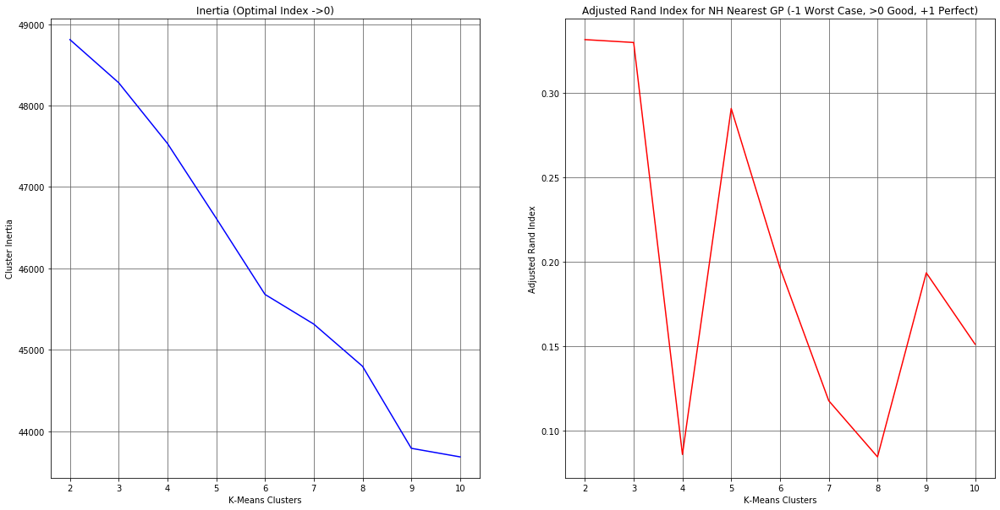

In [897]:
fig=plt.figure()


ax0=fig.add_subplot(1,2,1)
ax1=fig.add_subplot(1,2,2)

kmeans_score_inertia_list2.plot(kind='line',ax=ax0,color='blue')
kmeans_score_ari_nearby_list2.plot(kind='line',ax=ax1,color='red')

#plt.tight_layout(pad=0.1) #adjust spacing between subplots
fig.set_figheight(10) #set figure height
fig.set_figwidth(20) #set figure width

ax0.grid(b=True, which='major', color='#666666', linestyle='-')
ax1.grid(b=True, which='major', color='#666666', linestyle='-')


ax0.set_title('Inertia (Optimal Index ->0)')
ax1.set_title('Adjusted Rand Index for NH Nearest GP (-1 Worst Case, >0 Good, +1 Perfect)')

ax0.get_legend().remove()
ax1.get_legend().remove()

ax0.set_xlabel('K-Means Clusters')
ax1.set_xlabel('K-Means Clusters')

ax0.set_xticks(range(2,max_kmeans_clusters2))
ax1.set_xticks(range(2,max_kmeans_clusters2))

ax0.set_ylabel('Cluster Inertia')
ax1.set_ylabel('Adjusted Rand Index')

plt.show()

### The cluster inertia should generally decrease with increasing cluster size since the neighborhoods inside each cluster should decrease in number while increasing in similarity. For the results of this particular cluster analysis, the marginal rate of decrease appeared roughly constant and there was no apparent elbow to the curve, so this metric was not suitable for identifying an optimal cluster size to evaluate.

### A high adjusted Rand index indicates clusters are effectively grouping the neighborhoods by label. The highest index value occurred at a cluster size of 2, but a cluster size of 3 had only a slightly lower index value, so both were evaluated. The other cluster sizes had noticeably lower index values so they were not considered for evaluation.

## **Results and Discussion**

### A Folium map was generated to show the neighborhoods in each cluster of the 2 cluster set. The gastropub locations were also included to visualize how they related to the cluster neighborhoods.

### Summary statistics on each cluster were also generated for comparison. The statistics include the number of neighborhoods in each cluster, number of gastropubs near the neighborhoods in each cluster, and proportion of Toronto gastropubs represented in each cluster.

In [991]:
#Create Folium map to show neighborhoods by cluster and location of gastropubs
# Based on the evaluation metrics, the best cluster size for neighborhood by venue categories is 2

cluster_size_eval=2 #number of clusters to divide samples into for evaluation, minimum size is 2

label_column=pd.DataFrame(kmeans_labels_list2.iloc[cluster_size_eval-2,:])
label_column.columns=['Label']
label_column

nh_stats_venue_kmeans_labeled=pd.merge(nh_area_venue_mean[['Neighborhood','Neighborhood Latitude','Neighborhood Longitude']],nh_stats_venues)
nh_stats_venue_kmeans_labeled=pd.concat([label_column,nh_stats_venue_kmeans_labeled],axis=1)

cluster_gp_compare=pd.concat([gp_nh_present,label_column],axis=1)
cluster_gp_compare['NH in Cluster']=1

cluster_gp_compare_sum=cluster_gp_compare.groupby('Label').sum()
cluster_gp_compare_sum['PERCENT TOR GP in Cluster']=cluster_gp_compare_sum['Number of Nearby GP']/cluster_gp_compare['Number of Nearby GP'].sum()
cluster_gp_compare_sum['PERCENT TOR NH in Cluster']=cluster_gp_compare_sum['NH in Cluster']/cluster_gp_compare['NH in Cluster'].sum()
cluster_gp_compare_sum['PERCENT NH in Cluster W GP']=cluster_gp_compare_sum['GP Nearby']/cluster_gp_compare_sum['NH in Cluster']
cluster_gp_compare_sum=cluster_gp_compare_sum[['NH in Cluster','GP Nearby','Number of Nearby GP','PERCENT TOR NH in Cluster','PERCENT TOR GP in Cluster','PERCENT NH in Cluster W GP']]
cluster_gp_compare_sum.columns=['# of Neighborhoods in Cluster',
                                '# of Cluster Neighborhoods Near A Gastropub',
                                '# of Gastropubs Near A Neighborhood in the Cluster',
                                'Proportion of All Toronto Neighborhoods in Cluster',
                                'Proportion of All Toronto Gastropubs in Cluster',
                                'Proportion of Neighborhoods in Cluster Near A Gastropub']
display(cluster_gp_compare_sum)

# differentiate neighborhoods by k-means cluster labels

map_toronto = folium.Map(location=[tor_latitude, tor_longitude], height=1000, width=2000, zoom_start=11)

label_color_index=[]
for z in range(len(nh_stats_venue_kmeans_labeled)):
    
    if(nh_stats_venue_kmeans_labeled.iloc[z,0]==0):
        label_color='red'
    elif (nh_stats_venue_kmeans_labeled.iloc[z,0]==1):
        label_color='green'
    elif ((nh_stats_venue_kmeans_labeled.iloc[z,0]==2)):
        label_color='black'
    elif ((nh_stats_venue_kmeans_labeled.iloc[z,0]==3)):
        label_color='orange'
    elif ((nh_stats_venue_kmeans_labeled.iloc[z,0]==4)):
        label_color='blue'
    elif ((nh_stats_venue_kmeans_labeled.iloc[z,0]==5)):
        label_color='brown'
    elif ((nh_stats_venue_kmeans_labeled.iloc[z,0]==6)):
        label_color='yellow'
    elif ((nh_stats_venue_kmeans_labeled.iloc[z,0]==7)):
        label_color='pink'
    label_color_index.append([label_color,nh_stats_venue_kmeans_labeled.loc[z,'Neighborhood']])

label_color_index=pd.DataFrame(label_color_index)
label_color_index.columns=['Color','Neighborhood']
label_color_index

for i in range(len(tor_nh_coord_dict['features'])):
    map_toronto.choropleth(
    geo_data=tor_nh_coord_dict['features'][i],
    fill_color=label_color_index['Color'][label_color_index['Neighborhood']==tor_nh['Neighborhood'][i]].values[0]
    )
    lat=tor_nh['Neighborhood Latitude'][i]
    lng=tor_nh['Neighborhood Longitude'][i]
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=tor_nh['Neighborhood'][i],
        color='white',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto)

    
for x in range(len(gastropub_list_)):
    lat=gastropub_list_['Venue Latitude'][x]
    lng=gastropub_list_['Venue Longitude'][x]
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=[gastropub_list_['Venue Name'][x], gastropub_list_['Nearest Neighborhood'][x]],
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto)

map_toronto

,# of Neighborhoods in Cluster,# of Cluster Neighborhoods Near A Gastropub,# of Gastropubs Near A Neighborhood in the Cluster,Proportion of All Toronto Neighborhoods in Cluster,Proportion of All Toronto Gastropubs in Cluster,Proportion of Neighborhoods in Cluster Near A Gastropub
Label,,,,,,
0,103,16,18,0.735714,0.219512,0.155340
1,37,25,64,0.264286,0.780488,0.675676


C:\Users\Gamma user\AppData\Roaming\Python\Python37\site-packages\folium\folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


### The cluster details showed that even with a small cluster size of 2, k-means clustering was effective in identifying a neighborhood cluster that is favorable to gastropubs. Cluster 1 contained only 26% of all Toronto neighborhoods (37 of 140), but these neighborhoods are the nearest ones for 78% of all Toronto gastropubs (64 of 82).

### Since cluster size 3 had a slightly lower adjusted Rand index value, it was also evaluated.

In [1020]:
#Create Folium map to show neighborhoods by cluster and location of gastropubs
# Alternate cluster size of 3

cluster_size_eval=3 #number of clusters to divide samples into for evaluation, minimum size is 2

label_column=pd.DataFrame(kmeans_labels_list2.iloc[cluster_size_eval-2,:])
label_column.columns=['Label']
label_column

nh_stats_venue_kmeans3_labeled=pd.merge(nh_area_venue_mean[['Neighborhood','Neighborhood Latitude','Neighborhood Longitude']],nh_stats_venues)
nh_stats_venue_kmeans3_labeled=pd.concat([label_column,nh_stats_venue_kmeans_labeled],axis=1)

cluster_gp_compare=pd.concat([gp_nh_present,label_column],axis=1)
cluster_gp_compare['NH in Cluster']=1

cluster_gp_compare_sum=cluster_gp_compare.groupby('Label').sum()
cluster_gp_compare_sum['PERCENT TOR GP in Cluster']=cluster_gp_compare_sum['Number of Nearby GP']/cluster_gp_compare['Number of Nearby GP'].sum()
cluster_gp_compare_sum['PERCENT TOR NH in Cluster']=cluster_gp_compare_sum['NH in Cluster']/cluster_gp_compare['NH in Cluster'].sum()
cluster_gp_compare_sum['PERCENT NH in Cluster W GP']=cluster_gp_compare_sum['GP Nearby']/cluster_gp_compare_sum['NH in Cluster']
cluster_gp_compare_sum=cluster_gp_compare_sum[['NH in Cluster','GP Nearby','Number of Nearby GP','PERCENT TOR NH in Cluster','PERCENT TOR GP in Cluster','PERCENT NH in Cluster W GP']]
cluster_gp_compare_sum.columns=['# of Neighborhoods in Cluster',
                                '# of Cluster Neighborhoods Near A Gastropub',
                                '# of Gastropubs Near A Neighborhood in the Cluster',
                                'Proportion of All Toronto Neighborhoods in Cluster',
                                'Proportion of All Toronto Gastropubs in Cluster',
                                'Proportion of Neighborhoods in Cluster Near A Gastropub']
display(cluster_gp_compare_sum)

# differentiate neighborhoods by k-means cluster labels

map_toronto = folium.Map(location=[tor_latitude, tor_longitude], height=1000, width=2000, zoom_start=11)

label_color_index=[]
for z in range(len(nh_stats_venue_kmeans_labeled)):
    
    if(nh_stats_venue_kmeans3_labeled.iloc[z,0]==0):
        label_color='red'
    elif (nh_stats_venue_kmeans3_labeled.iloc[z,0]==1):
        label_color='green'
    elif ((nh_stats_venue_kmeans3_labeled.iloc[z,0]==2)):
        label_color='black'
    elif ((nh_stats_venue_kmeans3_labeled.iloc[z,0]==3)):
        label_color='orange'
    elif ((nh_stats_venue_kmeans3_labeled.iloc[z,0]==4)):
        label_color='blue'
    elif ((nh_stats_venue_kmeans3_labeled.iloc[z,0]==5)):
        label_color='brown'
    elif ((nh_stats_venue_kmeans3_labeled.iloc[z,0]==6)):
        label_color='yellow'
    elif ((nh_stats_venue_kmeans3_labeled.iloc[z,0]==7)):
        label_color='pink'
    label_color_index.append([label_color,nh_stats_venue_kmeans3_labeled.loc[z,'Neighborhood']])

label_color_index=pd.DataFrame(label_color_index)
label_color_index.columns=['Color','Neighborhood']
label_color_index

for i in range(len(tor_nh_coord_dict['features'])):
    map_toronto.choropleth(
    geo_data=tor_nh_coord_dict['features'][i],
    fill_color=label_color_index['Color'][label_color_index['Neighborhood']==tor_nh['Neighborhood'][i]].values[0]
    )
    lat=tor_nh['Neighborhood Latitude'][i]
    lng=tor_nh['Neighborhood Longitude'][i]
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=tor_nh['Neighborhood'][i],
        color='white',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto)

    
for x in range(len(gastropub_list_)):
    lat=gastropub_list_['Venue Latitude'][x]
    lng=gastropub_list_['Venue Longitude'][x]
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=[gastropub_list_['Venue Name'][x], gastropub_list_['Nearest Neighborhood'][x]],
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto)

map_toronto

,# of Neighborhoods in Cluster,# of Cluster Neighborhoods Near A Gastropub,# of Gastropubs Near A Neighborhood in the Cluster,Proportion of All Toronto Neighborhoods in Cluster,Proportion of All Toronto Gastropubs in Cluster,Proportion of Neighborhoods in Cluster Near A Gastropub
Label,,,,,,
0,1,1,1,0.007143,0.012195,1.000000
1,103,16,18,0.735714,0.219512,0.155340
2,36,24,63,0.257143,0.768293,0.666667


C:\Users\Gamma user\AppData\Roaming\Python\Python37\site-packages\folium\folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


### The differences between cluster sizes 2 and 3 were minimal. A few neighborhoods from the previous 2 cluster set switched clusters and the new cluster contained only one neighborhood. The number of neighborhoods and nearby gastropubs in the two larger clusters is nearly identical to the numbers for the 2 cluster set.
___

### **Detailed Analysis of Clusters**

### It was decided that cluster size 2 would be the preferred set to evaluate going forward. Cluster size 2 had the slightly higher adjusted Rand index value, the maps for both cluster sizes did not reveal any significant changes, and two clusters would be easier to compare than three.

### The neighborhood features for each cluster in were averaged and compared to each other. The mean values for the demographic features are show below.

In [1008]:
nh_stats_kmeans_labeled_group_mean=nh_stats_venue_kmeans_labeled.groupby('Label').mean()
nh_stats_kmeans_labeled_group_mean=nh_stats_kmeans_labeled_group_mean.transpose()
nh_stats_kmeans_labeled_group_mean.reset_index(inplace=True)
nh_stats_kmeans_labeled_group_mean.index.name='none'
nh_stats_kmeans_labeled_group_mean.rename(columns={'index':'Neighborhood Feature'},inplace=True)
nh_stats_kmeans_labeled_group_mean
nh_stats_kmeans_labeled_group_mean.iloc[3:31,:]

Label,Neighborhood Feature,0,1
none,,,
3,"2, Pop",19570.873786,19345.162162
4,"3, Pop Change",2.415534,8.564865
5,"4, Pop Density",4614.349515,10845.432432
6,"5, Children",0.158582,0.120822
7,"6, Youth",0.125799,0.113797
8,"7, Working Age",0.415342,0.521083
9,"8, Pre-Retire",0.131238,0.110432
10,"9, Seniors",0.168967,0.133960
11,"10, Older Seniors",0.027145,0.018952


### Among the demographic features, there were noticeable differences in average values between the clusters.

### To determine if the features were significantly different between the clusters, an ANOVA study was performed.

In [950]:
group0=nh_stats_venue_kmeans_labeled[nh_stats_venue_kmeans_labeled['Label']==0]
group1=nh_stats_venue_kmeans_labeled[nh_stats_venue_kmeans_labeled['Label']==1]

column_index=nh_stats_venue_kmeans_labeled.columns
nh_stats_venue_kmeans_anova=[]
for i in range(5,len(column_index)):
    f_val,p_val=stats.f_oneway(group0[column_index[i]],group1[column_index[i]])
    nh_stats_venue_kmeans_anova.append([column_index[i],f_val,p_val])

nh_stats_venue_kmeans_anova=pd.DataFrame(nh_stats_venue_kmeans_anova)
nh_stats_venue_kmeans_anova.columns=['Neighborhood Feature','ANOVA F-test Score','ANOVA p-Value']
nh_stats_venue_kmeans_anova

,Neighborhood Feature,ANOVA F-test Score,ANOVA p-Value
0,"2, Pop",0.013678,9.070683e-01
1,"3, Pop Change",14.221445,2.402406e-04
2,"4, Pop Density",66.305165,2.049869e-13
3,"5, Children",35.476355,2.035195e-08
4,"6, Youth",6.350161,1.287633e-02
...,...,...,...
370,Wings Joint,1.151535,2.851009e-01
371,Women's Store,0.523904,4.704063e-01
372,Yoga Studio,53.369496,2.010284e-11
373,Zoo,0.530911,4.674586e-01


### To determine if any of the ANOVA results were significant, they were filtered by minimum F-test score and maximum p-value. The F-test score must be above the F-test critical value and the p-value must be within a specified confidence level to be considered significant.

### The critical F-test value depended on the number of clusters, total number of samples (neighborhoods), and the confidence level.
### The F-test critical value numerator degree of freedom is the number of clusters - 1, or 1 for 2 clusters.
### The F-test critical value denominator degree of freedom is the total number of samples - number of clusters or 138 (140-2).
### The confidence level is .95
### All of these were input into the scipy.stats.f.ppf function to compute the critical value.

In [901]:
f_num=len(nh_stats_venue_kmeans_labeled['Label'].unique())-1
f_denom=len(nh_stats_venue_kmeans_labeled)-len(nh_stats_venue_kmeans_labeled['Label'].unique())
conf_level=0.95

f_critical_val=scipy.stats.f.ppf(q=conf_level, dfn=f_num, dfd=f_denom)
f_critical_val

3.9097292973150974

In [951]:
nh_stats_venue_kmeans_anova_crit=nh_stats_venue_kmeans_anova[(nh_stats_venue_kmeans_anova['ANOVA F-test Score']>f_critical_val)&(nh_stats_venue_kmeans_anova['ANOVA p-Value']<0.05)].sort_values(by='ANOVA F-test Score',ascending=False)
print('There are', len(nh_stats_venue_kmeans_anova_crit), 'features with significant differences between clusters')

There are 127 features with significant differences between clusters


### Since so many features had significant differences between clusters, the features were sorted by highest F-test score and the top features were shown below.

In [952]:
nh_stats_venue_kmeans_anova_crit=nh_stats_venue_kmeans_anova_crit.sort_values(by='ANOVA F-test Score',ascending=False)
nh_stats_venue_kmeans_anova_crit.reset_index(inplace=True)
nh_stats_venue_kmeans_anova_crit.drop('index',axis=1,inplace=True)
nh_stats_venue_kmeans_anova_crit.head(20)

,Neighborhood Feature,ANOVA F-test Score,ANOVA p-Value
0,Venue Count,394.602922,2.661151e-42
1,"7, Working Age",126.884293,2.808697e-21
2,"24, Couples without Children",97.239099,1.087054e-17
3,"25, Couples with Children",97.130556,1.122584e-17
4,"15, 1 Person Household",93.330417,3.494966e-17
5,"20, Avg Household Size",88.230416,1.654219e-16
6,"18, 4 Person Household",79.929569,2.247282e-15
7,Housing Density,75.686728,8.873876e-15
8,"17, 3 Person Household",71.750646,3.254650e-14
9,"4, Pop Density",66.305165,2.049869e-13


### The feature with the most significant difference between clusters was the average number of venues in each neighborhood. Several demographic feature followed behind. The most significant venue category feature was "yoga studio", at the 11th position.

### One notable feature was "gastropub" at the 15th position. This venue category feature was intentionally left out to limit its effect on the cluster algorithm, but it would appear the other features in cluster 1 neighborhoods make this cluster distinctly more favorable to hosting gastropubs than cluster 0 neighborhoods.

### The feature means fo the neighborhoods in each cluster were sorted, based on the F-test score. The dataframe below compared the means for the top differing features between the clusters.

In [1050]:
cluster_top_features=pd.merge(nh_stats_venue_kmeans_anova_crit['Neighborhood Feature'],nh_stats_kmeans_labeled_group_mean)
cluster_top_features.head(30)

,Neighborhood Feature,0,1
0,Venue Count,0.246117,0.849730
1,"7, Working Age",0.415342,0.521083
2,"24, Couples without Children",0.400107,0.550826
3,"25, Couples with Children",0.600196,0.449480
4,"15, 1 Person Household",0.262774,0.408135
5,"20, Avg Household Size",2.639029,2.081351
6,"18, 4 Person Household",0.159469,0.097253
7,Housing Density,1772.061737,5383.315628
8,"17, 3 Person Household",0.177857,0.131184
9,"4, Pop Density",4614.349515,10845.432432


### Based on the top 20 top differentiating features, cluster 1 neighborhoods differ from cluster 0 in the following general features:

>#### - Higher venue density
>#### - Higher proportion of population in working age group and smaller proportion in retirement age group
>#### - Higher proportion of couples without children, and fewer children as a proportion of population
>#### - Smaller average household size, with a greater proportion of 1 and 2 resident households, and smaller proportion of larger households
>#### - Higher population density and housing density
>#### - A greater proportion of leisure and entertainment venues
___

### Many statistically significant differences were observed earlier between features in cluster 0 and 1 neighborhoods. An ANOVA study was performed within cluster 1 to determine if there were statistically significant differences between the neighborhoods with and without gastropubs.

In [978]:
group1_0=nh_stats_venue_kmeans_labeled_2_[nh_stats_venue_kmeans_labeled_2_['New Map Label']==0]
group1_1=nh_stats_venue_kmeans_labeled_2_[nh_stats_venue_kmeans_labeled_2_['New Map Label']==1]

column_index=nh_stats_venue_kmeans_labeled_2_.columns
nh_stats_venue_kmeans_2_anova=[]
for i in range(7,len(column_index)):
    f_val,p_val=stats.f_oneway(group1_0[column_index[i]],group1_1[column_index[i]])
    nh_stats_venue_kmeans_2_anova.append([column_index[i],f_val,p_val])

nh_stats_venue_kmeans_2_anova=pd.DataFrame(nh_stats_venue_kmeans_2_anova)
nh_stats_venue_kmeans_2_anova.columns=['Neighborhood Attribute','ANOVA F-test Score','ANOVA p-Value']
nh_stats_venue_kmeans_2_anova

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:3349: RuntimeWarning: invalid value encountered in double_scalars
  f = msb / msw


,Neighborhood Attribute,ANOVA F-test Score,ANOVA p-Value
0,"2, Pop",0.193558,0.662677
1,"3, Pop Change",0.173894,0.679221
2,"4, Pop Density",2.801320,0.103102
3,"5, Children",0.125163,0.725624
4,"6, Youth",0.054386,0.816958
...,...,...,...
370,Wings Joint,4.691349,0.037212
371,Women's Store,0.466079,0.499291
372,Yoga Studio,2.545565,0.119596
373,Zoo,NaN,NaN


In [979]:
f_num=len(nh_stats_venue_kmeans_labeled_2_['Label'].unique())-1
f_denom=len(nh_stats_venue_kmeans_labeled_2_[nh_stats_venue_kmeans_labeled_2_['Label']==0])-len(nh_stats_venue_kmeans_labeled_2_['Label'].unique())
conf_level=0.95

f_critical_val2=scipy.stats.f.ppf(q=conf_level, dfn=f_num, dfd=f_denom)
f_critical_val2

3.935188692087253

In [1040]:
nh_stats_venue_kmeans_anova_crit2=nh_stats_venue_kmeans_2_anova[(nh_stats_venue_kmeans_2_anova['ANOVA F-test Score']>f_critical_val2)&(nh_stats_venue_kmeans_2_anova['ANOVA p-Value']<0.05)].sort_values(by='ANOVA F-test Score',ascending=False)
nh_stats_venue_kmeans_anova_crit2

,Neighborhood Attribute,ANOVA F-test Score,ANOVA p-Value
162,Gastropub,14.209179,0.000605
227,Lounge,8.036879,0.007564
155,Frozen Yogurt Shop,7.038574,0.011913
199,Ice Cream Shop,6.542813,0.015018
326,Sports Bar,5.332434,0.026954
205,Intersection,4.826673,0.034735
95,Churrascaria,4.729586,0.036493
370,Wings Joint,4.691349,0.037212
237,Miscellaneous Shop,4.668005,0.037658
229,Market,4.338355,0.044635


### Within cluster 1, the neighborhoods with and without gastropubs had noticeably fewer significant feature differences than when compared to cluster 0. Only 10 significant feature differences were found, all of which are for venue categories. One is gastropubs, the primary venue of interest in this study, and another two, sports bars and lounges, appear to be related types of venues. The other venue category features do not seem to be directly related to gastropubs.

In [981]:
print('Key differentiating attributes in cluster 1 neighborhoods with gastropubs')
display(group0_0[nh_stats_venue_kmeans_anova_crit2['Neighborhood Attribute'].values])
print('Key differentiating attributes in cluster 1 neighborhoods without gastropubs')
display(group0_1[nh_stats_venue_kmeans_anova_crit2['Neighborhood Attribute'].values])

Key differentiating attributes in cluster 1 neighborhoods with gastropubs


,Gastropub,Lounge,Frozen Yogurt Shop,Ice Cream Shop,Sports Bar,Intersection,Churrascaria,Wings Joint,Miscellaneous Shop,Market
3,0.020000,0.00,0.00,0.020000,0.000000,0.000000,0.0,0.0,0.0,0.00
6,0.030303,0.00,0.00,0.010101,0.000000,0.000000,0.0,0.0,0.0,0.00
14,0.020000,0.01,0.01,0.010000,0.010000,0.000000,0.0,0.0,0.0,0.00
19,0.055556,0.00,0.00,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.00
23,0.050505,0.00,0.00,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.00
28,0.058824,0.00,0.00,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.00
34,0.069767,0.00,0.00,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.00
46,0.000000,0.00,0.00,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.00
59,0.010000,0.00,0.00,0.010000,0.010000,0.000000,0.0,0.0,0.0,0.00
62,0.000000,0.00,0.00,0.010101,0.000000,0.000000,0.0,0.0,0.0,0.00


Key differentiating attributes in cluster 1 neighborhoods without gastropubs


,Gastropub,Lounge,Frozen Yogurt Shop,Ice Cream Shop,Sports Bar,Intersection,Churrascaria,Wings Joint,Miscellaneous Shop,Market
21,0.011236,0.000000,0.011236,0.033708,0.0,0.011236,0.000000,0.000000,0.000000,0.000000
32,0.010000,0.000000,0.000000,0.020000,0.0,0.000000,0.000000,0.000000,0.000000,0.010000
48,0.000000,0.000000,0.000000,0.000000,0.0,0.024691,0.000000,0.000000,0.012346,0.000000
49,0.011236,0.000000,0.000000,0.011236,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
82,0.010000,0.000000,0.000000,0.020000,0.0,0.000000,0.000000,0.020000,0.000000,0.000000
87,0.000000,0.010000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.010000,0.010000
88,0.000000,0.010101,0.010101,0.030303,0.0,0.000000,0.010101,0.000000,0.000000,0.000000
97,0.000000,0.010000,0.010000,0.020000,0.0,0.000000,0.010000,0.000000,0.000000,0.000000
109,0.000000,0.023529,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
120,0.000000,0.000000,0.000000,0.020000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000


### The significantly different features from each cluster 1 subgroup were compared. Both cluster 1 subgroups had few lounges, but one neighborhood without a nearby gastropub had a noticeably higher proportion of lounges among its venues. A few neighborhoods with gastropubs also had sports bars while there were no sports bars in any of the neighborhoods without a gastropub.

### Note that while several of the neighborhoods classified as not having a gastropub nearby did have gastropubs in their search results, these gastropubs were closer to the central coordinates of other neighborhoods, which is why they were still classified as not having nearby gastropubs.
___

### A new dataframe containing the neighborhood features, neighborhood labels, and neighborhood gastropub presence details was created. A new feature column 'New Map Label' was added for use in a new Folium map.
### Neighborhoods were assigned one of three label values in the "New Map Label" column - 0 for cluster 1 neighborhoods with gastropubs nearby, 1 for cluster 1 neighborhoods without gastropubs nearby, and 2 for all neighborhoods outside cluster 1.

In [910]:
nh_stats_venue_kmeans_labeled_2_=pd.merge(gp_nh_present[['Neighborhood','Number of Nearby GP']],nh_stats_venue_kmeans_labeled[['Neighborhood','Label']])

gp_cluster_number=1
new_map_color=[]
for i in range(len(nh_stats_venue_kmeans_labeled_2_)):
    if (nh_stats_venue_kmeans_labeled_2_.iloc[i,2]==gp_cluster_number):
        if (nh_stats_venue_kmeans_labeled_2_.iloc[i,1]>0):
            new_map_color.append(0) #assign map color label 0 to cluster 1 neighborhoods that currently have gastropubs nearby
        else:
            new_map_color.append(1) # assign map color label 1 to cluster 1 neighborhoods that currently do not have gastropubs nearby
    else:
        new_map_color.append(2) # assign map color label 2 to all neighborhoods outside cluster 1

nh_stats_venue_kmeans_labeled_2_['New Map Label']=pd.DataFrame(new_map_color)
nh_stats_venue_kmeans_labeled_2_=pd.merge(nh_stats_venue_kmeans_labeled_2_[['Neighborhood','Number of Nearby GP','New Map Label']], nh_stats_venue_kmeans_labeled)
nh_stats_venue_kmeans_labeled_2_

,Neighborhood,Number of Nearby GP,New Map Label,Label,Neighborhood Latitude,Neighborhood Longitude,"1, NH Number","2, Pop","3, Pop Change","4, Pop Density",...,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
0,Agincourt North (129),0,2,0,43.805441,-79.266712,129,29113.0,-3.9,3929.0,...,0.046512,0.0,0.0,0.000000,0.0,0.023256,0.000000,0.000000,0.0,0.0
1,Agincourt South-Malvern West (128),0,2,0,43.788658,-79.265612,128,23757.0,8.0,3034.0,...,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0
2,Alderwood (20),0,2,0,43.604937,-79.541611,20,12054.0,1.3,2435.0,...,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0
3,Annex (95),2,0,1,43.671585,-79.404001,95,30526.0,4.6,10863.0,...,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0
4,Banbury-Don Mills (42),0,2,0,43.737657,-79.349718,42,27695.0,2.9,2775.0,...,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.022727,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,Wychwood (94),0,1,1,43.676919,-79.425515,94,14349.0,2.6,8541.0,...,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.011236,0.0,0.0
136,Yonge-Eglinton (100),1,0,1,43.704689,-79.403590,100,11817.0,11.7,7162.0,...,0.010000,0.0,0.0,0.010000,0.0,0.000000,0.000000,0.010000,0.0,0.0
137,Yonge-St.Clair (97),2,0,1,43.687859,-79.397871,97,12528.0,7.5,10708.0,...,0.012658,0.0,0.0,0.012658,0.0,0.000000,0.000000,0.012658,0.0,0.0
138,York University Heights (27),0,2,0,43.765736,-79.488883,27,27593.0,-0.4,2086.0,...,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0


In [1052]:
# create Folium map with cluster 0 neighborhoods highlighted.
#Cluster 0 neighborhoods will be colored depending on whether they currently have gastropubs nearby.

map_toronto = folium.Map(location=[tor_latitude, tor_longitude], height=1000, width=2000, zoom_start=11)

label_color_index=[]
for z in range(len(nh_stats_venue_kmeans_labeled_2_)):
    
    if(nh_stats_venue_kmeans_labeled_2_.iloc[z,2]==0):
        label_color='red'
    elif (nh_stats_venue_kmeans_labeled_2_.iloc[z,2]==1):
        label_color='green'
    elif ((nh_stats_venue_kmeans_labeled_2_.iloc[z,2]==2)):
        label_color='black'
    label_color_index.append([label_color,nh_stats_venue_kmeans_labeled_2_.loc[z,'Neighborhood']])

label_color_index=pd.DataFrame(label_color_index)
label_color_index.columns=['Color','Neighborhood']
label_color_index

for i in range(len(tor_nh_coord_dict['features'])):
    map_toronto.choropleth(
    geo_data=tor_nh_coord_dict['features'][i],
    fill_color=label_color_index['Color'][label_color_index['Neighborhood']==tor_nh['Neighborhood'][i]].values[0]
    )
    lat=tor_nh['Neighborhood Latitude'][i]
    lng=tor_nh['Neighborhood Longitude'][i]
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=tor_nh['Neighborhood'][i],
        color='white',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto)

    
for x in range(len(gastropub_list_)):
    lat=gastropub_list_['Venue Latitude'][x]
    lng=gastropub_list_['Venue Longitude'][x]
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=[gastropub_list_['Venue Name'][x], gastropub_list_['Nearest Neighborhood'][x]],
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto)    

map_toronto

### The neighborhoods in red are cluster 1 neighborhoods with existing gastropubs nearby.

### The neighborhoods in green are cluster 1 neighborhoods without existing gastropubs nearby.

### The neighborhoods in black are in cluster 0.

In [913]:
nh1=nh_stats_venue_kmeans_labeled_2_[nh_stats_venue_kmeans_labeled_2_['New Map Label']==0]
print('There are',len(nh1),'cluster 1 neighborhoods with gastropubs nearby.')
display(nh1[['Neighborhood']])

nh2=nh_stats_venue_kmeans_labeled_2_[nh_stats_venue_kmeans_labeled_2_['New Map Label']==1]
print('There are',len(nh2),'cluster 1 neighborhoods without gastropubs nearby.')
display(nh2[['Neighborhood']])

There are 25 cluster 1 neighborhoods with gastropubs nearby.


,Neighborhood
3,Annex (95)
6,Bay Street Corridor (76)
14,Blake-Jones (69)
19,Cabbagetown-South St.James Town (71)
23,Church-Yonge Corridor (75)
28,Danforth (66)
29,Danforth East York (59)
34,Dufferin Grove (83)
46,Greenwood-Coxwell (65)
59,Junction Area (90)


There are 12 cluster 1 neighborhoods without gastropubs nearby.


,Neighborhood
21,Casa Loma (96)
32,Dovercourt-Wallace Emerson-Junction (93)
48,Henry Farm (53)
49,High Park North (88)
82,Mount Pleasant East (99)
87,Niagara (82)
88,North Riverdale (68)
97,Playter Estates-Danforth (67)
109,South Parkdale (85)
120,University (79)


## **Conclusion**

### The study showed that a data-driven approach to finding suitable new gastropub locations has great potential. K-means clustering was an effective method for identifying a cluster of Toronto neighborhoods near gastropubs, just based on neighborhood demographic and local venue information. At a cluster size of just 2, the algorithm was able to create a cluster (cluster 1) with a small percentage of the Toronto neighborhoods, but which a large percentage of the gastropubs were near. Not every neighborhood in this cluster had a nearby gastropub, but the demographic and venue profile features of all the neighborhoods in this cluster are distinctly different from neighborhoods outside. These differences may allow the former to be more favorable to supporting new gastropubs. Therefore the neighborhoods identified in cluster 1 are recommended as the top areas to initially investigate.

### Among the entire group of Toronto neighborhoods, no individual feature significantly correlated to a neighborhood having a gastropub nearby. However, there were numerous statistically significant differences between cluster 0 and 1, including the presence of gastropubs. Between the cluster 1 neighborhoods with and without gastropubs, there were few statistically significant differences, and most of them were for venues that do not appear to be directly related to gastropubs.

### A new gastropub could be located in one of the cluster 1 neighborhoods that already has a nearby gastropub, since they are proven to be viable locations, or another cluster 1 neighborhood without nearby gastropubs to potentially take advantage of less competition.

### There are many other details to consider before ultimately choosing a location for a new gastropub. While all of the neighborhoods in the cluster have similar demographic and venue profiles, there may be other neighborhood aspects that may explain why some currently do not have gastropubs, such as zoning and other local restrictions, site availability and costs, and transportation considerations. None of these were factors in the study.